In [41]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
from PIL import Image
import skimage, torch, torchvision
import pickle 
import cv2
from tqdm import tqdm
import random
from torch.utils.data import Dataset
import os
import random

In [2]:
dataset_path = "/mnt/scratch-lids/scratch/qixuanj/waterbird_complete95_forest2water2"

# Train Oracle classifier 

In [16]:
from torcheval.metrics import BinaryAUROC, MulticlassAUROC
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.transforms import v2

In [3]:
# File constructed by below 
with open("waterbirds_preprocessed_datasets_classifier.pkl", "rb") as f: 
    preprocessed_datasets = pickle.load(f)

In [7]:
transform = torchvision.transforms.Compose([v2.CenterCrop(224),
                                            v2.RandomHorizontalFlip(),
                                            v2.ToDtype(torch.float32, scale=True),
                                            v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), 
                                            ])

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [8]:
train_dataloader = torch.utils.data.DataLoader(preprocessed_datasets['train'], batch_size=8, shuffle=True)
extra_dataloader = torch.utils.data.DataLoader(preprocessed_datasets['extra'], batch_size=8, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(preprocessed_datasets['val'], batch_size=8, shuffle=False)
test_dataloader = torch.utils.data.DataLoader(preprocessed_datasets['test'], batch_size=8, shuffle=False)

In [9]:
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
model.fc =  torch.nn.Linear(2048, 1)

In [10]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)

In [11]:
output_dir = "waterbirds_results/oracle_group"
if not os.path.exists(output_dir): 
    os.makedirs(output_dir)

In [12]:
torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

In [13]:
all_dataset = torch.utils.data.ConcatDataset([preprocessed_datasets['train'], 
                                             preprocessed_datasets['extra'], 
                                             preprocessed_datasets['val'], 
                                             preprocessed_datasets['test']])

In [14]:
all_dataloader = torch.utils.data.DataLoader(all_dataset, batch_size=8, shuffle=True)

In [34]:
use_cutmix = False 
use_mixup = False
train_group = True

if train_group: 
    model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    model.fc =  torch.nn.Linear(2048, 4)
    criterion = torch.nn.CrossEntropyLoss()
else:
    model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    model.fc =  torch.nn.Linear(2048, 1)
    criterion = torch.nn.BCELoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)

epochs = 100
checkpoint_epochs = 10

train_aucs = []
val_aucs = [] 

device = "cuda"
model.to("cuda")
            
avg_loss = []
for epoch in range(epochs):
    model.train()
    task_outputs=[]
    task_targets=[]
    
    t = tqdm(all_dataloader)
    for batch_idx, sample in enumerate(t): 
        optimizer.zero_grad()
        if train_group: 
            images, targets = sample[0], sample[2]
        else: 
            images, targets = sample[0], sample[1]
            
        if use_cutmix: 
            images, converted_targets = cutmix(images, targets)
            converted_targets = converted_targets[:, 1]
            converted_targets = converted_targets.to(device)
        if use_mixup: 
            images, converted_targets = mixup(images, targets)
            converted_targets = converted_targets[:, 1]
            converted_targets = converted_targets.to(device)

        targets = targets.type(torch.LongTensor)
        images = images.to("cuda")
        targets = targets.to("cuda")
        outputs = model(images)

        if not train_group:
            sigmoid = torch.nn.Sigmoid()
            outputs = sigmoid(outputs)
        outputs = outputs.squeeze(1)
        
        if use_cutmix or use_mixup: 
            converted_targets = converted_targets.to(torch.float32)
            loss = criterion(outputs, converted_targets)
        else: 
            loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        avg_loss.append(loss.detach().cpu().numpy())
        task_outputs.append(outputs.detach().cpu().numpy())
        task_targets.append(targets.detach().cpu().numpy())
        t.set_description(f'Epoch {epoch + 1} - Loss = {np.mean(avg_loss):4.4f}')
        
    task_outputs = np.concatenate(task_outputs)
    task_targets = np.concatenate(task_targets)

    if train_group: 
        auc = MulticlassAUROC(num_classes=4)
    else: 
        auc = BinaryAUROC()
    auc.update(torch.Tensor(task_outputs), torch.Tensor(task_targets))
    auc_result = auc.compute()
    train_aucs.append(auc_result)
    
    if (epoch + 1) % checkpoint_epochs == 0: 
        print("checkpoint!")
        model.eval()
        t = tqdm(val_dataloader)
        val_task_outputs=[]
        val_task_targets=[]
        with torch.no_grad():
            for batch_idx, sample in enumerate(t):
                if train_group: 
                    images, targets = sample[0], sample[2]
                else:
                    images, targets = sample[0], sample[1]
                images = images.to("cuda")
                targets = targets.to("cuda")
                outputs = model(images)
                
                if not train_group: 
                    sigmoid = torch.nn.Sigmoid()
                    outputs = sigmoid(outputs)
                outputs = outputs.squeeze(1)
                
                val_task_outputs.append(outputs.detach().cpu().numpy())
                val_task_targets.append(targets.detach().cpu().numpy())
        val_task_outputs = np.concatenate(val_task_outputs)
        val_task_targets = np.concatenate(val_task_targets)

        if train_group: 
            auc = MulticlassAUROC(num_classes=4)
        else: 
            auc = BinaryAUROC()
        auc.update(torch.Tensor(val_task_outputs), torch.Tensor(val_task_targets))
        val_auc_result = auc.compute()
        val_aucs.append(val_auc_result)
        torch.save(model, f"{output_dir}/checkpoint{epoch + 1}.pt")
        print(f'Val Epoch {epoch + 1} - Avg AUC = {val_auc_result:4.4f}')
    print(f'Epoch {epoch + 1} - Avg AUC = {auc_result:4.4f}')
    
torch.save(model, f"{output_dir}/model.pt")
with open(f"{output_dir}/train_aucs.pkl", "wb") as f: 
    pickle.dump(train_aucs, f) 
with open(f"{output_dir}/val_aucs.pkl", "wb") as f: 
    pickle.dump(val_aucs, f) 

Epoch 1 - Loss = 0.8898: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:54<00:00,  8.90it/s]


Epoch 1 - Avg AUC = 0.8031


Epoch 2 - Loss = 0.8302: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:40<00:00, 10.21it/s]


Epoch 2 - Avg AUC = 0.8446


Epoch 3 - Loss = 0.7975: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:35<00:00, 10.69it/s]


Epoch 3 - Avg AUC = 0.8564


Epoch 4 - Loss = 0.7722: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:40<00:00, 10.16it/s]


Epoch 4 - Avg AUC = 0.8681


Epoch 5 - Loss = 0.7526: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:35<00:00, 10.68it/s]


Epoch 5 - Avg AUC = 0.8755


Epoch 6 - Loss = 0.7358: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:41<00:00, 10.03it/s]


Epoch 6 - Avg AUC = 0.8820


Epoch 7 - Loss = 0.7205: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:47<00:00,  9.48it/s]


Epoch 7 - Avg AUC = 0.8898


Epoch 8 - Loss = 0.7072: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [01:47<00:00,  9.56it/s]


Epoch 8 - Avg AUC = 0.8932


Epoch 9 - Loss = 0.6944: 100%|████████████████████████████████████████████████████████████████████████████| 1023/1023 [02:04<00:00,  8.22it/s]


Epoch 9 - Avg AUC = 0.9008


Epoch 10 - Loss = 0.6831: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:03<00:00,  8.28it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 11.93it/s]


Val Epoch 10 - Avg AUC = 0.7415
Epoch 10 - Avg AUC = 0.9021


Epoch 11 - Loss = 0.6719: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:05<00:00,  8.15it/s]


Epoch 11 - Avg AUC = 0.9051


Epoch 12 - Loss = 0.6619: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:07<00:00,  8.05it/s]


Epoch 12 - Avg AUC = 0.9079


Epoch 13 - Loss = 0.6528: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [01:53<00:00,  8.98it/s]


Epoch 13 - Avg AUC = 0.9102


Epoch 14 - Loss = 0.6443: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:06<00:00,  8.09it/s]


Epoch 14 - Avg AUC = 0.9132


Epoch 15 - Loss = 0.6358: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:06<00:00,  8.06it/s]


Epoch 15 - Avg AUC = 0.9169


Epoch 16 - Loss = 0.6277: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:11<00:00,  7.79it/s]


Epoch 16 - Avg AUC = 0.9192


Epoch 17 - Loss = 0.6200: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:05<00:00,  8.17it/s]


Epoch 17 - Avg AUC = 0.9205


Epoch 18 - Loss = 0.6127: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:15<00:00,  7.57it/s]


Epoch 18 - Avg AUC = 0.9215


Epoch 19 - Loss = 0.6053: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:13<00:00,  7.65it/s]


Epoch 19 - Avg AUC = 0.9252


Epoch 20 - Loss = 0.5987: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:17<00:00,  7.44it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 10.99it/s]


Val Epoch 20 - Avg AUC = 0.7478
Epoch 20 - Avg AUC = 0.9268


Epoch 21 - Loss = 0.5918: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:14<00:00,  7.58it/s]


Epoch 21 - Avg AUC = 0.9299


Epoch 22 - Loss = 0.5853: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:09<00:00,  7.90it/s]


Epoch 22 - Avg AUC = 0.9313


Epoch 23 - Loss = 0.5787: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:16<00:00,  7.47it/s]


Epoch 23 - Avg AUC = 0.9336


Epoch 24 - Loss = 0.5727: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:11<00:00,  7.79it/s]


Epoch 24 - Avg AUC = 0.9324


Epoch 25 - Loss = 0.5671: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:22<00:00,  7.17it/s]


Epoch 25 - Avg AUC = 0.9329


Epoch 26 - Loss = 0.5611: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:20<00:00,  7.27it/s]


Epoch 26 - Avg AUC = 0.9365


Epoch 27 - Loss = 0.5552: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:20<00:00,  7.27it/s]


Epoch 27 - Avg AUC = 0.9385


Epoch 28 - Loss = 0.5496: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:22<00:00,  7.20it/s]


Epoch 28 - Avg AUC = 0.9395


Epoch 29 - Loss = 0.5440: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:13<00:00,  7.67it/s]


Epoch 29 - Avg AUC = 0.9415


Epoch 30 - Loss = 0.5391: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [01:50<00:00,  9.22it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:05<00:00, 12.52it/s]


Val Epoch 30 - Avg AUC = 0.7485
Epoch 30 - Avg AUC = 0.9393


Epoch 31 - Loss = 0.5336: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [01:55<00:00,  8.84it/s]


Epoch 31 - Avg AUC = 0.9448


Epoch 32 - Loss = 0.5285: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [01:57<00:00,  8.72it/s]


Epoch 32 - Avg AUC = 0.9440


Epoch 33 - Loss = 0.5234: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:01<00:00,  8.44it/s]


Epoch 33 - Avg AUC = 0.9449


Epoch 34 - Loss = 0.5186: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:02<00:00,  8.37it/s]


Epoch 34 - Avg AUC = 0.9458


Epoch 35 - Loss = 0.5135: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:03<00:00,  8.31it/s]


Epoch 35 - Avg AUC = 0.9487


Epoch 36 - Loss = 0.5088: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:04<00:00,  8.22it/s]


Epoch 36 - Avg AUC = 0.9473


Epoch 37 - Loss = 0.5039: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:01<00:00,  8.42it/s]


Epoch 37 - Avg AUC = 0.9496


Epoch 38 - Loss = 0.4991: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:05<00:00,  8.18it/s]


Epoch 38 - Avg AUC = 0.9518


Epoch 39 - Loss = 0.4947: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:04<00:00,  8.19it/s]


Epoch 39 - Avg AUC = 0.9487


Epoch 40 - Loss = 0.4901: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:02<00:00,  8.33it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:05<00:00, 12.01it/s]


Val Epoch 40 - Avg AUC = 0.7494
Epoch 40 - Avg AUC = 0.9530


Epoch 41 - Loss = 0.4857: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:00<00:00,  8.50it/s]


Epoch 41 - Avg AUC = 0.9518


Epoch 42 - Loss = 0.4812: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [01:54<00:00,  8.90it/s]


Epoch 42 - Avg AUC = 0.9555


Epoch 43 - Loss = 0.4768: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:06<00:00,  8.11it/s]


Epoch 43 - Avg AUC = 0.9562


Epoch 44 - Loss = 0.4723: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:02<00:00,  8.33it/s]


Epoch 44 - Avg AUC = 0.9574


Epoch 45 - Loss = 0.4705:  40%|██████████████████████████████                                              | 405/1023 [00:45<01:07,  9.18it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Epoch 62 - Loss = 0.4063: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:03<00:00,  8.30it/s]


Epoch 62 - Avg AUC = 0.9646


Epoch 63 - Loss = 0.4032: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:02<00:00,  8.38it/s]


Epoch 63 - Avg AUC = 0.9674


Epoch 64 - Loss = 0.4002: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:04<00:00,  8.20it/s]


Epoch 64 - Avg AUC = 0.9650


Epoch 65 - Loss = 0.3972: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:06<00:00,  8.09it/s]


Epoch 65 - Avg AUC = 0.9685


Epoch 66 - Loss = 0.3940: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:03<00:00,  8.26it/s]


Epoch 66 - Avg AUC = 0.9706


Epoch 67 - Loss = 0.3912: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:02<00:00,  8.34it/s]


Epoch 67 - Avg AUC = 0.9672


Epoch 68 - Loss = 0.3883: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:04<00:00,  8.22it/s]


Epoch 68 - Avg AUC = 0.9675


Epoch 69 - Loss = 0.3855: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:05<00:00,  8.17it/s]


Epoch 69 - Avg AUC = 0.9674


Epoch 70 - Loss = 0.3829: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:06<00:00,  8.12it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:05<00:00, 14.24it/s]


Val Epoch 70 - Avg AUC = 0.7499
Epoch 70 - Avg AUC = 0.9670


Epoch 71 - Loss = 0.3803: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:13<00:00,  7.65it/s]


Epoch 71 - Avg AUC = 0.9683


Epoch 72 - Loss = 0.3777: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:16<00:00,  7.47it/s]


Epoch 72 - Avg AUC = 0.9684


Epoch 73 - Loss = 0.3749: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:41<00:00,  6.35it/s]


Epoch 73 - Avg AUC = 0.9700


Epoch 74 - Loss = 0.3722: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:12<00:00,  7.73it/s]


Epoch 74 - Avg AUC = 0.9703


Epoch 75 - Loss = 0.3697: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:13<00:00,  7.67it/s]


Epoch 75 - Avg AUC = 0.9689


Epoch 76 - Loss = 0.3671: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:55<00:00,  5.82it/s]


Epoch 76 - Avg AUC = 0.9688


Epoch 77 - Loss = 0.3646: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:20<00:00,  7.30it/s]


Epoch 77 - Avg AUC = 0.9707


Epoch 78 - Loss = 0.3623: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:22<00:00,  7.16it/s]


Epoch 78 - Avg AUC = 0.9691


Epoch 79 - Loss = 0.3599: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:27<00:00,  6.92it/s]


Epoch 79 - Avg AUC = 0.9717


Epoch 80 - Loss = 0.3576: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:27<00:00,  6.94it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:05<00:00, 14.07it/s]


Val Epoch 80 - Avg AUC = 0.7498
Epoch 80 - Avg AUC = 0.9700


Epoch 81 - Loss = 0.3553: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:20<00:00,  7.26it/s]


Epoch 81 - Avg AUC = 0.9694


Epoch 82 - Loss = 0.3530: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:15<00:00,  7.56it/s]


Epoch 82 - Avg AUC = 0.9727


Epoch 83 - Loss = 0.3507: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:39<00:00,  6.40it/s]


Epoch 83 - Avg AUC = 0.9723


Epoch 84 - Loss = 0.3486: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:20<00:00,  7.27it/s]


Epoch 84 - Avg AUC = 0.9694


Epoch 85 - Loss = 0.3465: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:14<00:00,  7.61it/s]


Epoch 85 - Avg AUC = 0.9707


Epoch 86 - Loss = 0.3445: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:34<00:00,  6.63it/s]


Epoch 86 - Avg AUC = 0.9699


Epoch 87 - Loss = 0.3423: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:17<00:00,  7.44it/s]


Epoch 87 - Avg AUC = 0.9729


Epoch 88 - Loss = 0.3403: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:15<00:00,  7.52it/s]


Epoch 88 - Avg AUC = 0.9722


Epoch 89 - Loss = 0.3383: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:25<00:00,  7.04it/s]


Epoch 89 - Avg AUC = 0.9735


Epoch 90 - Loss = 0.3363: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:14<00:00,  7.62it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:04<00:00, 14.83it/s]


Val Epoch 90 - Avg AUC = 0.7500
Epoch 90 - Avg AUC = 0.9714


Epoch 91 - Loss = 0.3344: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:10<00:00,  7.83it/s]


Epoch 91 - Avg AUC = 0.9725


Epoch 92 - Loss = 0.3325: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:12<00:00,  7.70it/s]


Epoch 92 - Avg AUC = 0.9719


Epoch 93 - Loss = 0.3307: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:27<00:00,  6.95it/s]


Epoch 93 - Avg AUC = 0.9715


Epoch 94 - Loss = 0.3287: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:28<00:00,  6.89it/s]


Epoch 94 - Avg AUC = 0.9735


Epoch 95 - Loss = 0.3269: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:28<00:00,  6.90it/s]


Epoch 95 - Avg AUC = 0.9718


Epoch 96 - Loss = 0.3252: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:34<00:00,  6.64it/s]


Epoch 96 - Avg AUC = 0.9710


Epoch 97 - Loss = 0.3235: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:27<00:00,  6.94it/s]


Epoch 97 - Avg AUC = 0.9714


Epoch 98 - Loss = 0.3218: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:37<00:00,  6.49it/s]


Epoch 98 - Avg AUC = 0.9732


Epoch 99 - Loss = 0.3201: 100%|███████████████████████████████████████████████████████████████████████████| 1023/1023 [02:38<00:00,  6.45it/s]


Epoch 99 - Avg AUC = 0.9725


Epoch 100 - Loss = 0.3185: 100%|██████████████████████████████████████████████████████████████████████████| 1023/1023 [02:28<00:00,  6.91it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 10.97it/s]


Val Epoch 100 - Avg AUC = 0.7499
Epoch 100 - Avg AUC = 0.9748


# CutMix or MixUp

In [27]:
output_dir = "waterbirds_results/base2"
if not os.path.exists(output_dir): 
    os.makedirs(output_dir)

In [28]:
torch.manual_seed(1)
random.seed(1)
np.random.seed(1)

In [29]:
use_cutmix = False
use_mixup = False 
freeze_encoder = False

model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
model.fc =  torch.nn.Linear(2048, 1)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)

cutmix = v2.CutMix(num_classes=2)
mixup = v2.MixUp(num_classes=2)

epochs = 100
checkpoint_epochs = 10

train_aucs = []
val_aucs = [] 

device = "cuda"
model.to("cuda")

if freeze_encoder: 
    for param in model.parameters():
        param.requires_grad = False
    # Only train classifier 
    for param in model.fc.parameters():
        param.requires_grad = True
            
avg_loss = []
for epoch in range(epochs):
    model.train()
    task_outputs=[]
    task_targets=[]
    
    t = tqdm(train_dataloader)
    for batch_idx, sample in enumerate(t): 
        optimizer.zero_grad()
        images, targets = sample[0], sample[1]
        if use_cutmix: 
            images, converted_targets = cutmix(images, targets)
            # double check 
            converted_targets = converted_targets[:, 1]
            converted_targets = converted_targets.to(device)
        if use_mixup: 
            images, converted_targets = mixup(images, targets)
            converted_targets = converted_targets[:, 1]
            converted_targets = converted_targets.to(device)
        
        images = images.to("cuda")
        targets = targets.to("cuda")
        outputs = model(images)
        sigmoid = torch.nn.Sigmoid()
        outputs = sigmoid(outputs)
        outputs = outputs.squeeze(1)
        
        targets = targets.to(torch.float32)
        if use_cutmix or use_mixup: 
            converted_targets = converted_targets.to(torch.float32)

            # Check exact same shape 
            loss = criterion(outputs, converted_targets)
        else: 
            loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        avg_loss.append(loss.detach().cpu().numpy())
        task_outputs.append(outputs.detach().cpu().numpy())
        task_targets.append(targets.detach().cpu().numpy())
        t.set_description(f'Epoch {epoch + 1} - Loss = {np.mean(avg_loss):4.4f}')
        
    task_outputs = np.concatenate(task_outputs)
    task_targets = np.concatenate(task_targets)
    auc = BinaryAUROC()
    auc.update(torch.Tensor(task_outputs), torch.Tensor(task_targets))
    auc_result = auc.compute()
    train_aucs.append(auc_result)
    
    if (epoch + 1) % checkpoint_epochs == 0: 
        print("checkpoint!")
        model.eval()
        t = tqdm(val_dataloader)
        val_task_outputs=[]
        val_task_targets=[]
        with torch.no_grad():
            for batch_idx, sample in enumerate(t):
                images, targets = sample[0], sample[1]
                images = images.to("cuda")
                targets = targets.to("cuda")
                outputs = model(images)
                sigmoid = torch.nn.Sigmoid()
                outputs = sigmoid(outputs)
                outputs = outputs.squeeze(1)
                targets = targets.to(torch.float32)
                val_task_outputs.append(outputs.detach().cpu().numpy())
                val_task_targets.append(targets.detach().cpu().numpy())
        val_task_outputs = np.concatenate(val_task_outputs)
        val_task_targets = np.concatenate(val_task_targets)
        auc.update(torch.Tensor(val_task_outputs), torch.Tensor(val_task_targets))
        val_auc_result = auc.compute()
        val_aucs.append(val_auc_result)
        torch.save(model, f"{output_dir}/checkpoint{epoch + 1}.pt")
        print(f'Val Epoch {epoch + 1} - Avg AUC = {val_auc_result:4.4f}')
    print(f'Epoch {epoch + 1} - Avg AUC = {auc_result:4.4f}')
    
torch.save(model, f"{output_dir}/model.pt")
with open(f"{output_dir}/train_aucs.pkl", "wb") as f: 
    pickle.dump(train_aucs, f) 
with open(f"{output_dir}/val_aucs.pkl", "wb") as f: 
    pickle.dump(val_aucs, f) 

Epoch 1 - Loss = 0.3617: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:14<00:00,  8.57it/s]


Epoch 1 - Avg AUC = 0.8836


Epoch 2 - Loss = 0.3310: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.41it/s]


Epoch 2 - Avg AUC = 0.9202


Epoch 3 - Loss = 0.3094: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.39it/s]


Epoch 3 - Avg AUC = 0.9310


Epoch 4 - Loss = 0.2947: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.39it/s]


Epoch 4 - Avg AUC = 0.9385


Epoch 5 - Loss = 0.2848: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.32it/s]


Epoch 5 - Avg AUC = 0.9443


Epoch 6 - Loss = 0.2720: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.27it/s]


Epoch 6 - Avg AUC = 0.9592


Epoch 7 - Loss = 0.2630: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.26it/s]


Epoch 7 - Avg AUC = 0.9601


Epoch 8 - Loss = 0.2569: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.56it/s]


Epoch 8 - Avg AUC = 0.9573


Epoch 9 - Loss = 0.2518: 100%|██████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.10it/s]


Epoch 9 - Avg AUC = 0.9603


Epoch 10 - Loss = 0.2459: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.25it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 10.50it/s]


Val Epoch 10 - Avg AUC = 0.9568
Epoch 10 - Avg AUC = 0.9649


Epoch 11 - Loss = 0.2412: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.29it/s]


Epoch 11 - Avg AUC = 0.9643


Epoch 12 - Loss = 0.2401: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.97it/s]


Epoch 12 - Avg AUC = 0.9498


Epoch 13 - Loss = 0.2363: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.00it/s]


Epoch 13 - Avg AUC = 0.9628


Epoch 14 - Loss = 0.2321: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.47it/s]


Epoch 14 - Avg AUC = 0.9712


Epoch 15 - Loss = 0.2286: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 13.95it/s]


Epoch 15 - Avg AUC = 0.9691


Epoch 16 - Loss = 0.2251: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.88it/s]


Epoch 16 - Avg AUC = 0.9707


Epoch 17 - Loss = 0.2221: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.90it/s]


Epoch 17 - Avg AUC = 0.9711


Epoch 18 - Loss = 0.2181: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.72it/s]


Epoch 18 - Avg AUC = 0.9787


Epoch 19 - Loss = 0.2137: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.03it/s]


Epoch 19 - Avg AUC = 0.9844


Epoch 20 - Loss = 0.2107: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.06it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:03<00:00, 23.24it/s]


Val Epoch 20 - Avg AUC = 0.9653
Epoch 20 - Avg AUC = 0.9772


Epoch 21 - Loss = 0.2077: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.82it/s]


Epoch 21 - Avg AUC = 0.9782


Epoch 22 - Loss = 0.2046: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.63it/s]


Epoch 22 - Avg AUC = 0.9826


Epoch 23 - Loss = 0.2017: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.12it/s]


Epoch 23 - Avg AUC = 0.9809


Epoch 24 - Loss = 0.1995: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.11it/s]


Epoch 24 - Avg AUC = 0.9781


Epoch 25 - Loss = 0.1972: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.92it/s]


Epoch 25 - Avg AUC = 0.9822


Epoch 26 - Loss = 0.1939: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.03it/s]


Epoch 26 - Avg AUC = 0.9890


Epoch 27 - Loss = 0.1918: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.18it/s]


Epoch 27 - Avg AUC = 0.9823


Epoch 28 - Loss = 0.1885: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.17it/s]


Epoch 28 - Avg AUC = 0.9910


Epoch 29 - Loss = 0.1862: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.20it/s]


Epoch 29 - Avg AUC = 0.9869


Epoch 30 - Loss = 0.1837: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.91it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:05<00:00, 12.07it/s]


Val Epoch 30 - Avg AUC = 0.9742
Epoch 30 - Avg AUC = 0.9893


Epoch 31 - Loss = 0.1808: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.12it/s]


Epoch 31 - Avg AUC = 0.9918


Epoch 32 - Loss = 0.1784: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.12it/s]


Epoch 32 - Avg AUC = 0.9896


Epoch 33 - Loss = 0.1765: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.07it/s]


Epoch 33 - Avg AUC = 0.9874


Epoch 34 - Loss = 0.1740: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.07it/s]


Epoch 34 - Avg AUC = 0.9927


Epoch 35 - Loss = 0.1725: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.00it/s]


Epoch 35 - Avg AUC = 0.9846


Epoch 36 - Loss = 0.1690: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.01it/s]


Epoch 36 - Avg AUC = 0.9988


Epoch 37 - Loss = 0.1659: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.28it/s]


Epoch 37 - Avg AUC = 0.9977


Epoch 38 - Loss = 0.1638: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.11it/s]


Epoch 38 - Avg AUC = 0.9935


Epoch 39 - Loss = 0.1618: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.37it/s]


Epoch 39 - Avg AUC = 0.9924


Epoch 40 - Loss = 0.1594: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.21it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:03<00:00, 20.64it/s]


Val Epoch 40 - Avg AUC = 0.9803
Epoch 40 - Avg AUC = 0.9964


Epoch 41 - Loss = 0.1582: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.11it/s]


Epoch 41 - Avg AUC = 0.9877


Epoch 42 - Loss = 0.1562: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.24it/s]


Epoch 42 - Avg AUC = 0.9944


Epoch 43 - Loss = 0.1541: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.16it/s]


Epoch 43 - Avg AUC = 0.9961


Epoch 44 - Loss = 0.1523: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.97it/s]


Epoch 44 - Avg AUC = 0.9940


Epoch 45 - Loss = 0.1495: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.74it/s]


Epoch 45 - Avg AUC = 0.9997


Epoch 46 - Loss = 0.1478: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.24it/s]


Epoch 46 - Avg AUC = 0.9949


Epoch 47 - Loss = 0.1463: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.00it/s]


Epoch 47 - Avg AUC = 0.9949


Epoch 48 - Loss = 0.1449: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.98it/s]


Epoch 48 - Avg AUC = 0.9930


Epoch 49 - Loss = 0.1432: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.18it/s]


Epoch 49 - Avg AUC = 0.9963


Epoch 50 - Loss = 0.1415: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.91it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:03<00:00, 22.68it/s]


Val Epoch 50 - Avg AUC = 0.9813
Epoch 50 - Avg AUC = 0.9967


Epoch 51 - Loss = 0.1399: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.20it/s]


Epoch 51 - Avg AUC = 0.9973


Epoch 52 - Loss = 0.1382: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.52it/s]


Epoch 52 - Avg AUC = 0.9975


Epoch 53 - Loss = 0.1362: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.00it/s]


Epoch 53 - Avg AUC = 0.9994


Epoch 54 - Loss = 0.1346: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.86it/s]


Epoch 54 - Avg AUC = 0.9978


Epoch 55 - Loss = 0.1328: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.03it/s]


Epoch 55 - Avg AUC = 0.9993


Epoch 56 - Loss = 0.1308: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 16.06it/s]


Epoch 56 - Avg AUC = 0.9997


Epoch 57 - Loss = 0.1290: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.85it/s]


Epoch 57 - Avg AUC = 0.9991


Epoch 58 - Loss = 0.1275: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.88it/s]


Epoch 58 - Avg AUC = 0.9986


Epoch 59 - Loss = 0.1264: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.03it/s]


Epoch 59 - Avg AUC = 0.9961


Epoch 60 - Loss = 0.1249: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.24it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 10.87it/s]


Val Epoch 60 - Avg AUC = 0.9830
Epoch 60 - Avg AUC = 0.9995


Epoch 61 - Loss = 0.1233: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.68it/s]


Epoch 61 - Avg AUC = 0.9994


Epoch 62 - Loss = 0.1217: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.85it/s]


Epoch 62 - Avg AUC = 0.9995


Epoch 63 - Loss = 0.1208: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.91it/s]


Epoch 63 - Avg AUC = 0.9943


Epoch 64 - Loss = 0.1198: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.52it/s]


Epoch 64 - Avg AUC = 0.9972


Epoch 65 - Loss = 0.1190: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.98it/s]


Epoch 65 - Avg AUC = 0.9957


Epoch 66 - Loss = 0.1178: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.39it/s]


Epoch 66 - Avg AUC = 0.9981


Epoch 67 - Loss = 0.1165: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.69it/s]


Epoch 67 - Avg AUC = 0.9994


Epoch 68 - Loss = 0.1153: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:07<00:00, 15.72it/s]


Epoch 68 - Avg AUC = 0.9985


Epoch 69 - Loss = 0.1140: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.75it/s]


Epoch 69 - Avg AUC = 0.9998


Epoch 70 - Loss = 0.1128: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.35it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:03<00:00, 23.28it/s]


Val Epoch 70 - Avg AUC = 0.9873
Epoch 70 - Avg AUC = 0.9989


Epoch 71 - Loss = 0.1119: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.78it/s]


Epoch 71 - Avg AUC = 0.9981


Epoch 72 - Loss = 0.1108: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.06it/s]


Epoch 72 - Avg AUC = 0.9994


Epoch 73 - Loss = 0.1094: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.99it/s]


Epoch 73 - Avg AUC = 1.0000


Epoch 74 - Loss = 0.1082: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.29it/s]


Epoch 74 - Avg AUC = 0.9998


Epoch 75 - Loss = 0.1071: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.23it/s]


Epoch 75 - Avg AUC = 0.9995


Epoch 76 - Loss = 0.1058: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.27it/s]


Epoch 76 - Avg AUC = 1.0000


Epoch 77 - Loss = 0.1045: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.26it/s]


Epoch 77 - Avg AUC = 1.0000


Epoch 78 - Loss = 0.1042: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.15it/s]


Epoch 78 - Avg AUC = 0.9944


Epoch 79 - Loss = 0.1034: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.59it/s]


Epoch 79 - Avg AUC = 0.9986


Epoch 80 - Loss = 0.1026: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.90it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 11.36it/s]


Val Epoch 80 - Avg AUC = 0.9800
Epoch 80 - Avg AUC = 0.9983


Epoch 81 - Loss = 0.1017: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.13it/s]


Epoch 81 - Avg AUC = 0.9994


Epoch 82 - Loss = 0.1006: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.19it/s]


Epoch 82 - Avg AUC = 0.9997


Epoch 83 - Loss = 0.0996: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.19it/s]


Epoch 83 - Avg AUC = 0.9999


Epoch 84 - Loss = 0.0987: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.16it/s]


Epoch 84 - Avg AUC = 0.9996


Epoch 85 - Loss = 0.0978: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.32it/s]


Epoch 85 - Avg AUC = 0.9992


Epoch 86 - Loss = 0.0971: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.55it/s]


Epoch 86 - Avg AUC = 0.9983


Epoch 87 - Loss = 0.0963: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.83it/s]


Epoch 87 - Avg AUC = 0.9994


Epoch 88 - Loss = 0.0954: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.06it/s]


Epoch 88 - Avg AUC = 0.9997


Epoch 89 - Loss = 0.0952: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.14it/s]


Epoch 89 - Avg AUC = 0.9926


Epoch 90 - Loss = 0.0947: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.96it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:03<00:00, 23.16it/s]


Val Epoch 90 - Avg AUC = 0.9770
Epoch 90 - Avg AUC = 0.9981


Epoch 91 - Loss = 0.0939: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.44it/s]


Epoch 91 - Avg AUC = 0.9996


Epoch 92 - Loss = 0.0930: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.68it/s]


Epoch 92 - Avg AUC = 0.9999


Epoch 93 - Loss = 0.0922: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.37it/s]


Epoch 93 - Avg AUC = 0.9995


Epoch 94 - Loss = 0.0914: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.77it/s]


Epoch 94 - Avg AUC = 0.9999


Epoch 95 - Loss = 0.0905: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.96it/s]


Epoch 95 - Avg AUC = 1.0000


Epoch 96 - Loss = 0.0896: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.00it/s]


Epoch 96 - Avg AUC = 1.0000


Epoch 97 - Loss = 0.0890: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.95it/s]


Epoch 97 - Avg AUC = 0.9998


Epoch 98 - Loss = 0.0881: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 15.01it/s]


Epoch 98 - Avg AUC = 0.9999


Epoch 99 - Loss = 0.0873: 100%|█████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.25it/s]


Epoch 99 - Avg AUC = 1.0000


Epoch 100 - Loss = 0.0865: 100%|████████████████████████████████████████████████████████████████████████████| 125/125 [00:08<00:00, 14.15it/s]


checkpoint!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [00:06<00:00, 11.70it/s]


Val Epoch 100 - Avg AUC = 0.9812
Epoch 100 - Avg AUC = 1.0000


In [222]:
# Evaluate  
epochs = np.arange(10, 101, 10)

# output_dir = "waterbirds_results/cutmix2"
output_dir = "waterbirds_results/oracle"

with open(f"{output_dir}/val_aucs.pkl", "rb") as f: 
    val_aucs = pickle.load(f)
val_aucs = [x.item() for x in val_aucs] 

# Get best checkpoint by highest val AUC 
checkpoint = str(epochs[np.argmax(np.array(val_aucs))])
print(f"Best checkpoint is {checkpoint}")

model = torch.load(f"{output_dir}/checkpoint{checkpoint}.pt")
model.eval()
t = tqdm(test_dataloader)

test_task_outputs=[]
test_task_targets=[]
with torch.no_grad():
    for batch_idx, sample in enumerate(t):
        images, targets = sample[0], sample[1]
        images = images.to("cuda")
        targets = targets.to("cuda")
        outputs = model(images)
        sigmoid = torch.nn.Sigmoid()
        outputs = sigmoid(outputs)
        outputs = outputs.squeeze(1)
        targets = targets.to(torch.float32)
        test_task_outputs.append(outputs.detach().cpu().numpy())
        test_task_targets.append(targets.detach().cpu().numpy())
test_task_outputs = np.concatenate(test_task_outputs)
test_task_targets = np.concatenate(test_task_targets)

auc = BinaryAUROC()
auc.update(torch.Tensor(test_task_outputs), torch.Tensor(test_task_targets))
test_auc_result = auc.compute()
print(test_auc_result)

with open(f"{output_dir}/test_auc.pkl", "wb") as f: 
    pickle.dump([test_auc_result], f) 
with open(f"{output_dir}/test_outputs.pkl", "wb") as f: 
    pickle.dump(test_task_outputs, f) 
with open(f"{output_dir}/test_targets.pkl", "wb") as f: 
    pickle.dump(test_task_targets, f) 

Best checkpoint is 100


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:03<00:00, 11.43it/s]

tensor(0.9897, dtype=torch.float64)


In [43]:
with open(f"{output_dir}/test_outputs.pkl", "rb") as f: 
    test_outputs = pickle.load(f)
with open(f"{output_dir}/test_targets.pkl", "rb") as f: 
    test_targets = pickle.load(f)

In [54]:
use_cutmix = False
use_mixup = False 
freeze_encoder = False

mix_dataset = torch.utils.data.ConcatDataset([preprocessed_datasets['train'], 
                                             preprocessed_datasets['extra'],])
mix_dataloader = torch.utils.data.DataLoader(mix_dataset, batch_size=8, shuffle=True)

output_dir = "waterbirds_results/base2"
savedir = output_dir + '/transfer'
if not os.path.exists(savedir): 
    os.makedirs(savedir)
    
with open(f"{output_dir}/val_aucs.pkl", "rb") as f: 
    val_aucs = pickle.load(f)
val_aucs = [x.item() for x in val_aucs] 

epochs_map = np.arange(10, 101, 10)
checkpoint = str(epochs_map[np.argmax(np.array(val_aucs))])
model = torch.load(f"{output_dir}/checkpoint{checkpoint}.pt")

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)

cutmix = v2.CutMix(num_classes=2)
mixup = v2.MixUp(num_classes=2)

epochs = 100
checkpoint_epochs = 5

train_aucs = []
val_aucs = [] 

device = "cuda"
model.to("cuda")

if freeze_encoder: 
    for param in model.parameters():
        param.requires_grad = False
    # Only train classifier 
    for param in model.fc.parameters():
        param.requires_grad = True
            
avg_loss = []
for epoch in range(epochs):
    model.train()
    task_outputs=[]
    task_targets=[]
    
    t = tqdm(mix_dataloader)
    for batch_idx, sample in enumerate(t): 
        optimizer.zero_grad()
        images, targets = sample[0], sample[1]
        if use_cutmix: 
            images, converted_targets = cutmix(images, targets)
            converted_targets = converted_targets[:, 1]
            converted_targets = converted_targets.to(device)
        if use_mixup: 
            images, converted_targets = mixup(images, targets)
            converted_targets = converted_targets[:, 1]
            converted_targets = converted_targets.to(device)
        
        images = images.to("cuda")
        targets = targets.to("cuda")
        outputs = model(images)
        sigmoid = torch.nn.Sigmoid()
        outputs = sigmoid(outputs)
        outputs = outputs.squeeze(1)
        
        targets = targets.to(torch.float32)
        if use_cutmix or use_mixup: 
            converted_targets = converted_targets.to(torch.float32)
            loss = criterion(outputs, converted_targets)
        else: 
            loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        avg_loss.append(loss.detach().cpu().numpy())
        task_outputs.append(outputs.detach().cpu().numpy())
        task_targets.append(targets.detach().cpu().numpy())
        t.set_description(f'Extra Epoch {epoch + 1} - Loss = {np.mean(avg_loss):4.4f}')
        
    task_outputs = np.concatenate(task_outputs)
    task_targets = np.concatenate(task_targets)
    auc = BinaryAUROC()
    auc.update(torch.Tensor(task_outputs), torch.Tensor(task_targets))
    auc_result = auc.compute()
    train_aucs.append(auc_result)
    
    if (epoch + 1) % checkpoint_epochs == 0: 
        print("checkpoint!")
        model.eval()
        t = tqdm(test_dataloader)
        val_task_outputs=[]
        val_task_targets=[]
        with torch.no_grad():
            for batch_idx, sample in enumerate(t):
                images, targets = sample[0], sample[1]
                images = images.to("cuda")
                targets = targets.to("cuda")
                outputs = model(images)
                sigmoid = torch.nn.Sigmoid()
                outputs = sigmoid(outputs)
                outputs = outputs.squeeze(1)
                targets = targets.to(torch.float32)
                val_task_outputs.append(outputs.detach().cpu().numpy())
                val_task_targets.append(targets.detach().cpu().numpy())
        val_task_outputs = np.concatenate(val_task_outputs)
        val_task_targets = np.concatenate(val_task_targets)
        auc.update(torch.Tensor(val_task_outputs), torch.Tensor(val_task_targets))
        val_auc_result = auc.compute()
        val_aucs.append(val_auc_result)
        # torch.save(model, f"{savedir}/checkpoint{epoch + 1}.pt")
        print(f'Test Epoch {epoch + 1} - Avg AUC = {val_auc_result:4.4f}')
    print(f'Epoch {epoch + 1} - Avg AUC = {auc_result:4.4f}')
    
# torch.save(model, f"{savedir}/model.pt")
# with open(f"{savedir}/train_aucs.pkl", "wb") as f: 
#     pickle.dump(train_aucs, f) 
# with open(f"{savedir}/test_aucs.pkl", "wb") as f: 
#     pickle.dump(val_aucs, f) 

Extra Epoch 1 - Loss = 0.6198: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.49it/s]


Epoch 1 - Avg AUC = 0.6809


Extra Epoch 2 - Loss = 0.5346: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 16.17it/s]


Epoch 2 - Avg AUC = 0.7837


Extra Epoch 3 - Loss = 0.4937: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:13<00:00, 16.30it/s]


Epoch 3 - Avg AUC = 0.8260


Extra Epoch 4 - Loss = 0.4712: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:13<00:00, 16.38it/s]


Epoch 4 - Avg AUC = 0.8301


Extra Epoch 5 - Loss = 0.4528: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.89it/s]


checkpoint!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:10<00:00, 10.31it/s]


Test Epoch 5 - Avg AUC = 0.7596
Epoch 5 - Avg AUC = 0.8551


Extra Epoch 6 - Loss = 0.4367: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.76it/s]


Epoch 6 - Avg AUC = 0.8790


Extra Epoch 7 - Loss = 0.4191: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.79it/s]


Epoch 7 - Avg AUC = 0.9061


Extra Epoch 8 - Loss = 0.4057: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:13<00:00, 16.49it/s]


Epoch 8 - Avg AUC = 0.9058


Extra Epoch 9 - Loss = 0.3929: 100%|████████████████████████████████████████████████████████████████████████| 227/227 [00:15<00:00, 15.12it/s]


Epoch 9 - Avg AUC = 0.9197


Extra Epoch 10 - Loss = 0.3826: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:15<00:00, 14.58it/s]


checkpoint!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:15<00:00,  9.63it/s]


Test Epoch 10 - Avg AUC = 0.7753
Epoch 10 - Avg AUC = 0.9190


Extra Epoch 11 - Loss = 0.3690: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:32<00:00,  6.93it/s]


Epoch 11 - Avg AUC = 0.9520


Extra Epoch 12 - Loss = 0.3608: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:20<00:00, 11.11it/s]


Epoch 12 - Avg AUC = 0.9328


Extra Epoch 13 - Loss = 0.3503: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:18<00:00, 12.57it/s]


Epoch 13 - Avg AUC = 0.9559


Extra Epoch 14 - Loss = 0.3385: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:13<00:00, 16.24it/s]


Epoch 14 - Avg AUC = 0.9698


Extra Epoch 15 - Loss = 0.3310: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:13<00:00, 16.25it/s]


checkpoint!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:16<00:00,  9.53it/s]


Test Epoch 15 - Avg AUC = 0.7761
Epoch 15 - Avg AUC = 0.9541


Extra Epoch 16 - Loss = 0.3224: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:25<00:00,  8.75it/s]


Epoch 16 - Avg AUC = 0.9666


Extra Epoch 17 - Loss = 0.3126: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.72it/s]


Epoch 17 - Avg AUC = 0.9792


Extra Epoch 18 - Loss = 0.3034: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.55it/s]


Epoch 18 - Avg AUC = 0.9809


Extra Epoch 19 - Loss = 0.2963: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:15<00:00, 14.79it/s]


Epoch 19 - Avg AUC = 0.9747


Extra Epoch 20 - Loss = 0.2890: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.95it/s]


checkpoint!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:09<00:00, 10.41it/s]


Test Epoch 20 - Avg AUC = 0.8002
Epoch 20 - Avg AUC = 0.9798


Extra Epoch 21 - Loss = 0.2809: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.44it/s]


Epoch 21 - Avg AUC = 0.9880


Extra Epoch 22 - Loss = 0.2741: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.51it/s]


Epoch 22 - Avg AUC = 0.9848


Extra Epoch 23 - Loss = 0.2678: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.49it/s]


Epoch 23 - Avg AUC = 0.9856


Extra Epoch 24 - Loss = 0.2618: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:13<00:00, 16.42it/s]


Epoch 24 - Avg AUC = 0.9860


Extra Epoch 25 - Loss = 0.2567: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 16.18it/s]


checkpoint!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:05<00:00, 11.10it/s]


Test Epoch 25 - Avg AUC = 0.7689
Epoch 25 - Avg AUC = 0.9839


Extra Epoch 26 - Loss = 0.2510: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:19<00:00, 11.73it/s]


Epoch 26 - Avg AUC = 0.9890


Extra Epoch 27 - Loss = 0.2448: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:15<00:00, 14.47it/s]


Epoch 27 - Avg AUC = 0.9941


Extra Epoch 28 - Loss = 0.2402: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.53it/s]


Epoch 28 - Avg AUC = 0.9877


Extra Epoch 29 - Loss = 0.2359: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.24it/s]


Epoch 29 - Avg AUC = 0.9869


Extra Epoch 30 - Loss = 0.2307: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:14<00:00, 15.26it/s]


checkpoint!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 725/725 [01:05<00:00, 11.14it/s]


Test Epoch 30 - Avg AUC = 0.7838
Epoch 30 - Avg AUC = 0.9955


Extra Epoch 31 - Loss = 0.2263: 100%|███████████████████████████████████████████████████████████████████████| 227/227 [00:19<00:00, 11.53it/s]


Epoch 31 - Avg AUC = 0.9925


Extra Epoch 32 - Loss = 0.2243:  41%|█████████████████████████████▊                                          | 94/227 [00:07<00:10, 12.30it/s]


KeyboardInterrupt: 

In [60]:
from torcheval.metrics import BinaryAccuracy

In [97]:
with open(f"{output_dir}/test_outputs.pkl", "rb") as f: 
    task_outputs = pickle.load(f) 
with open(f"{output_dir}/test_targets.pkl", "rb") as f: 
    task_targets = pickle.load(f) 

In [98]:
val_task_outputs = task_outputs
val_task_targets = task_targets

In [99]:
metric = BinaryAccuracy()
metric.update(torch.Tensor(val_task_outputs), torch.Tensor(val_task_targets))
print("Class Balanced Accuracy {0:.3f}".format(metric.compute()))

Class Balanced Accuracy 0.588


In [100]:
groups = np.array(preprocessed_datasets['test'].groups)

In [101]:
# Get index of in-domain: groups 0 and 3 
indomain =  (groups == 0) | (groups == 3)
outdomain = (groups == 1) | (groups == 2)

In [102]:
metric.update(torch.Tensor(val_task_outputs[indomain]), torch.Tensor(val_task_targets[indomain]))
print("In Domain Accuracy {0:.3f}".format(metric.compute()))
metric.update(torch.Tensor(val_task_outputs[outdomain]), torch.Tensor(val_task_targets[outdomain]))
print("Out Domain Accuracy {0:.3f}".format(metric.compute()))

In Domain Accuracy 0.695
Out Domain Accuracy 0.588


In [103]:
output_dir

'waterbirds_results/base2'

# Read results

In [19]:
from torcheval.metrics import BinaryAccuracy, BinaryAUROC

In [244]:
import scipy.stats as st
# Calculate 95% confidence intervals with Student t's continuous random variable 
def calculate_CI(df, names):
    df['lower_95'] = 0
    df['upper_95'] = 0
    df['lower_95_err'] = 0
    df['upper_95_err'] = 0
    for name in names: 
        if name == "oracle": 
            df.loc[name, 'lower_95'] = df.loc[name, 'mean']
            df.loc[name, 'upper_95'] = df.loc[name, 'mean']
            df.loc[name, 'lower_95_err'] = 0
            df.loc[name, 'upper_95_err'] = 0
        else:
            data = df.loc[name, [0, 1, 2, 3, 4]]
            lower, upper = st.t.interval(confidence=0.95, df=len(data)-1, loc=np.mean(data), scale=st.sem(data)) 
            df.loc[name, 'lower_95'] = lower
            df.loc[name, 'upper_95'] = upper
            df.loc[name, 'lower_95_err'] = df.loc[name, 'mean'] - lower
            df.loc[name, 'upper_95_err'] = upper - df.loc[name, 'mean']
    return df

In [253]:
# All is pre-transfer results 
names = ["base", "cutmix", "mixup", "oracle"]
seeds = [0, 1, 2, 3, 4]

acc_metric = BinaryAccuracy()
auc_metric = BinaryAUROC()
groups = np.array(preprocessed_datasets['test'].groups)
indomain =  (groups == 0) | (groups == 3)
outdomain = (groups == 1) | (groups == 2)

df_aucs = pd.DataFrame(index=names, columns = seeds)
df_bacc = pd.DataFrame(index=names, columns = seeds)
df_in_acc = pd.DataFrame(index=names, columns = seeds)
df_out_acc = pd.DataFrame(index=names, columns = seeds)

for name in names: 
    for seed in seeds: 
        if name == "oracle": 
            output_dir = "waterbirds_results/oracle"
        else:
            output_dir = f"waterbirds_results/{name}_seed{seed}"

        with open(f"{output_dir}/test_outputs.pkl", "rb") as f: 
            test_outputs = pickle.load(f)
        with open(f"{output_dir}/test_targets.pkl", "rb") as f: 
            test_targets = pickle.load(f)

        auc_metric = BinaryAUROC()
        auc_metric.update(torch.Tensor(test_outputs), torch.Tensor(test_targets))
        df_aucs.loc[name, seed] = auc_metric.compute().item()

        acc_metric = BinaryAccuracy()
        acc_metric.update(torch.Tensor(test_outputs), torch.Tensor(test_targets))
        df_bacc.loc[name, seed] = acc_metric.compute().item()
        
        acc_metric = BinaryAccuracy()
        acc_metric.update(torch.Tensor(test_outputs[indomain]), torch.Tensor(test_targets[indomain]))
        df_in_acc.loc[name, seed] = acc_metric.compute().item()
        
        acc_metric = BinaryAccuracy()
        acc_metric.update(torch.Tensor(test_outputs[outdomain]), torch.Tensor(test_targets[outdomain]))
        df_out_acc.loc[name, seed] = acc_metric.compute().item()

In [254]:
df_aucs['mean'] = df_aucs.mean(axis=1)
df_aucs['std'] = df_aucs.std(axis=1)
df_bacc['mean'] = df_bacc.mean(axis=1)
df_bacc['std'] = df_bacc.std(axis=1)
df_in_acc['mean'] = df_in_acc.mean(axis=1)
df_in_acc['std'] = df_bacc.std(axis=1)
df_out_acc['mean'] = df_out_acc.mean(axis=1)
df_out_acc['std'] = df_bacc.std(axis=1)

df_aucs = calculate_CI(df_aucs, names)
df_bacc = calculate_CI(df_bacc, names)
df_in_acc = calculate_CI(df_in_acc, names)
df_out_acc = calculate_CI(df_out_acc, names)

df_aucs.to_csv("waterbirds_results/source_aucs.csv")
df_bacc.to_csv("waterbirds_results/source_baccs.csv")
df_in_acc.to_csv("waterbirds_results/source_in_accs.csv")
df_out_acc.to_csv("waterbirds_results/source_out_accs.csv")

In [255]:
df_in_acc

,0,1,2,3,4,mean,std,lower_95,upper_95,lower_95_err,upper_95_err
base,0.907145,0.911633,0.925095,0.911633,0.922679,0.915637,0.217831,0.905955,0.925319,0.009682,0.009682
cutmix,0.929928,0.930618,0.926476,0.921298,0.933725,0.928409,0.226243,0.922527,0.934290,0.005881,0.005881
mixup,0.924059,0.915775,0.918191,0.921988,0.914394,0.918882,0.228826,0.913810,0.923953,0.005071,0.005071
oracle,0.973076,0.973076,0.973076,0.973076,0.973076,0.973076,0.361265,0.973076,0.973076,0.000000,0.000000


In [256]:
df_out_acc

,0,1,2,3,4,mean,std,lower_95,upper_95,lower_95_err,upper_95_err
base,0.266828,0.256127,0.256817,0.231619,0.310666,0.264411,0.217831,0.228494,0.300329,0.035917,0.035917
cutmix,0.339317,0.297894,0.367276,0.256817,0.27097,0.306455,0.226243,0.248963,0.363946,0.057492,0.057492
mixup,0.318605,0.325509,0.266137,0.32689,0.36417,0.320262,0.228826,0.276664,0.363860,0.043598,0.043598
oracle,0.938557,0.938557,0.938557,0.938557,0.938557,0.938557,0.361265,0.938557,0.938557,0.000000,0.000000


In [235]:
# Transfer results 
names = ["base", "cutmix", "mixup", "oracle"]
seeds = [0, 1, 2, 3, 4]

acc_metric = BinaryAccuracy()
auc_metric = BinaryAUROC()
groups = np.array(preprocessed_datasets['test'].groups)
indomain =  (groups == 0) | (groups == 3)
outdomain = (groups == 1) | (groups == 2)

df_aucs = pd.DataFrame(index=names, columns = seeds)
df_bacc = pd.DataFrame(index=names, columns = seeds)
df_in_acc = pd.DataFrame(index=names, columns = seeds)
df_out_acc = pd.DataFrame(index=names, columns = seeds)

for name in names: 
    for seed in seeds: 
        if name == "oracle": 
            output_dir = "waterbirds_results/oracle"
        else:
            output_dir = f"waterbirds_results/{name}_seed{seed}/transfer"

        with open(f"{output_dir}/test_outputs.pkl", "rb") as f: 
            test_outputs = pickle.load(f)
        with open(f"{output_dir}/test_targets.pkl", "rb") as f: 
            test_targets = pickle.load(f)

        auc_metric = BinaryAUROC()
        auc_metric.update(torch.Tensor(test_outputs), torch.Tensor(test_targets))
        df_aucs.loc[name, seed] = auc_metric.compute().item()
        
        acc_metric = BinaryAccuracy()
        acc_metric.update(torch.Tensor(test_outputs), torch.Tensor(test_targets))
        df_bacc.loc[name, seed] = acc_metric.compute().item()

        acc_metric = BinaryAccuracy()
        acc_metric.update(torch.Tensor(test_outputs[indomain]), torch.Tensor(test_targets[indomain]))
        df_in_acc.loc[name, seed] = acc_metric.compute().item()
        
        acc_metric = BinaryAccuracy()
        acc_metric.update(torch.Tensor(test_outputs[outdomain]), torch.Tensor(test_targets[outdomain]))
        df_out_acc.loc[name, seed] = acc_metric.compute().item()

In [236]:
df_aucs['mean'] = df_aucs.mean(axis=1)
df_aucs['std'] = df_aucs.std(axis=1)
df_bacc['mean'] = df_bacc.mean(axis=1)
df_bacc['std'] = df_bacc.std(axis=1)
df_in_acc['mean'] = df_in_acc.mean(axis=1)
df_in_acc['std'] = df_bacc.std(axis=1)
df_out_acc['mean'] = df_out_acc.mean(axis=1)
df_out_acc['std'] = df_bacc.std(axis=1)

In [245]:
df_aucs = calculate_CI(df_aucs, names)
df_bacc = calculate_CI(df_bacc, names)
df_in_acc = calculate_CI(df_in_acc, names)
df_out_acc = calculate_CI(df_out_acc, names)

In [246]:
df_aucs

,0,1,2,3,4,mean,std,lower_95,upper_95,lower_95_err,upper_95_err
base,0.686024,0.718268,0.712207,0.739838,0.685341,0.708336,0.020652,0.679666,0.737006,0.028670,0.028670
cutmix,0.751416,0.728485,0.740218,0.751858,0.78718,0.751831,0.019645,0.724560,0.779103,0.027271,0.027271
mixup,0.694289,0.68816,0.727846,0.712186,0.724751,0.709447,0.015894,0.687382,0.731511,0.022065,0.022065
oracle,0.989679,0.989679,0.989679,0.989679,0.989679,0.989679,0.0,0.989679,0.989679,0.000000,0.000000


In [247]:
df_bacc

,0,1,2,3,4,mean,std,lower_95,upper_95,lower_95_err,upper_95_err
base,0.759579,0.759406,0.765965,0.758716,0.752675,0.759268,0.004213,0.753420,0.765116,0.005848,0.005848
cutmix,0.798585,0.769071,0.777874,0.796686,0.802554,0.788954,0.013081,0.770794,0.807114,0.018160,0.018160
mixup,0.685192,0.797549,0.787194,0.774249,0.756817,0.7602,0.039897,0.704815,0.815586,0.055385,0.055385
oracle,0.955816,0.955816,0.955816,0.955816,0.955816,0.955816,0.0,0.955816,0.955816,0.000000,0.000000


In [252]:
df_aucs.to_csv("waterbirds_results/transfer_aucs.csv")
df_bacc.to_csv("waterbirds_results/transfer_baccs.csv")
df_in_acc.to_csv("waterbirds_results/transfer_in_accs.csv")
df_out_acc.to_csv("waterbirds_results/transfer_out_accs.csv")

## Make barplot

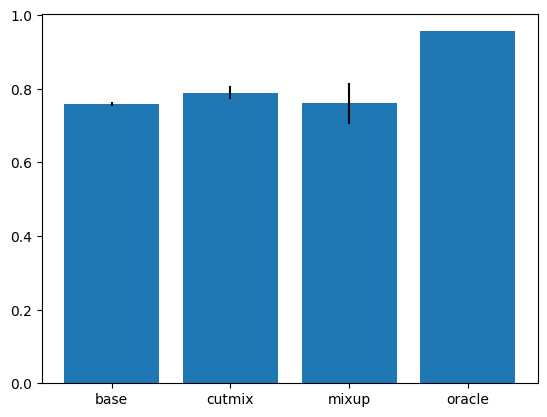

In [248]:
plt.bar(df_bacc.index, df_bacc['mean'], yerr = df_bacc[['lower_95_err', 'upper_95_err']].T)
plt.show()

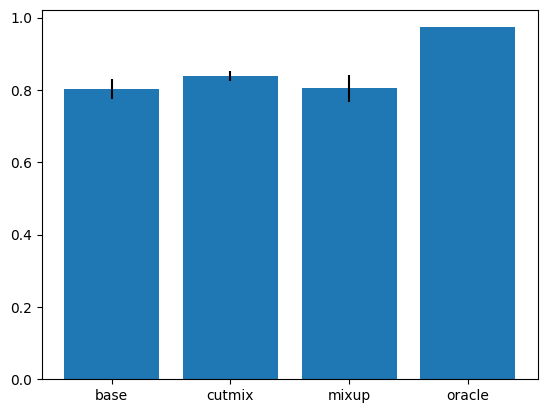

In [250]:
plt.bar(df_bacc.index, df_in_acc['mean'], yerr = df_in_acc[['lower_95_err', 'upper_95_err']].T)
plt.show()

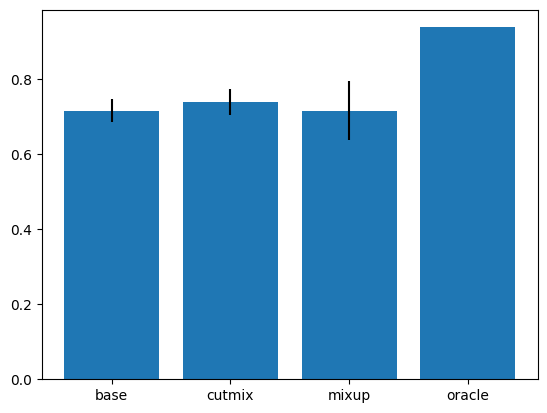

In [251]:
plt.bar(df_bacc.index, df_out_acc['mean'], yerr = df_out_acc[['lower_95_err', 'upper_95_err']].T)
plt.show()

# Load from ALIA

In [219]:
# Causes issues for huggingface dataset

# from ALIA.datasets.Waterbirds import Waterbirds

In [99]:
from Waterbirds_copy import Waterbirds

In [100]:
root = dataset_path

In [199]:
# ['land_landbird', 'land_waterbird', 'water_landbird', 'water_waterbird'] 
train_ds = Waterbirds(root, "train", transform=transform)
val_ds = Waterbirds(root, "val",transform=transform)
test_ds = Waterbirds(root, "test", transform=transform)

train 	 group counts: Counter({0: 3498, 3: 1057, 2: 184, 1: 56})
val 	 group counts: Counter({0: 467, 2: 466, 3: 133, 1: 133})
test 	 group counts: Counter({0: 2255, 2: 2255, 3: 642, 1: 642})


In [ ]:
# They have a custom exaggerated shift 
# training - 1139, extra - 834 (from test), validation - 600, testing - 5794

In [200]:
print(len(train_ds))
print(len(val_ds))
print(len(test_ds))

4795
1199
5794


In [201]:
# Train only landbird on land and waterbird on water 
print(len(Waterbirds.get_subset(train_ds, groups=[0])))
print(len(Waterbirds.get_subset(train_ds, groups=[3])))

770
230


In [202]:
# Validation biased - keep this setting 
print(len(Waterbirds.get_subset(val_ds, groups=[0])))
print(len(Waterbirds.get_subset(val_ds, groups=[3])))

443
131


In [203]:
# Keep full test set 
print(len(Waterbirds.get_subset(test_ds, groups=[0])))
print(len(Waterbirds.get_subset(test_ds, groups=[1])))
print(len(Waterbirds.get_subset(test_ds, groups=[2])))
print(len(Waterbirds.get_subset(test_ds, groups=[3])))

770
230
770
230


In [204]:
# Separate out 1000 images for training 
print(len(Waterbirds.get_subset(train_ds, groups=[1])))
print(len(Waterbirds.get_subset(train_ds, groups=[2])))
print(len(Waterbirds.get_subset(val_ds, groups=[1])))
print(len(Waterbirds.get_subset(val_ds, groups=[2])))

56
184
130
446


In [205]:
# the "test examples that we have access to 
extra_ids1 = list(Waterbirds.get_subset(train_ds, groups=[1])) + list(Waterbirds.get_subset(train_ds, groups=[2])) 
extra_ds1 = torch.utils.data.Subset(train_ds, extra_ids1)
extra_ids2 = list(Waterbirds.get_subset(val_ds, groups=[1])) + list(Waterbirds.get_subset(val_ds, groups=[2]))
extra_ds2 = torch.utils.data.Subset(val_ds, extra_ids2)
extra_ds = torch.utils.data.ConcatDataset([extra_ds1, extra_ds2])

In [206]:
print(len(extra_ds))

816


In [207]:
train_ids = list(Waterbirds.get_subset(train_ds, groups=[0])) + list(Waterbirds.get_subset(train_ds, groups=[3]))
val_ids = list(Waterbirds.get_subset(val_ds, groups=[0])) + list(Waterbirds.get_subset(val_ds, groups=[3]))

In [208]:
# Generate dataset subsets 
train_ds_sub = torch.utils.data.Subset(train_ds, train_ids)
val_ds_sub = torch.utils.data.Subset(val_ds, val_ids)

In [209]:
print(len(train_ds_sub))
print(len(val_ds_sub))

1000
574


In [210]:
# set to max num available 
train_nums = [10, 50, 100, 250, 500, 816]

In [211]:
# Learn custom tokens through stable diffusion 
# Finetune model 

In [212]:
preprocessed_datasets = {
    "train": train_ds_sub, 
    "val": val_ds_sub, 
    "extra": extra_ds, 
    "test": test_ds} 

In [214]:
with open("waterbirds_preprocessed_datasets_classifier.pkl", "wb") as f: 
    pickle.dump(preprocessed_datasets, f)

## Get huggingface dataset for train and extra

In [258]:
with open("waterbirds_preprocessed_datasets.pkl", "rb") as f: 
    preprocessed_datasets = pickle.load(f)

In [262]:
split_data = preprocessed_datasets['train']

(<PIL.Image.Image image mode=RGB size=500x392 at 0x7FCCAD9B1BB0>, 0, 0)


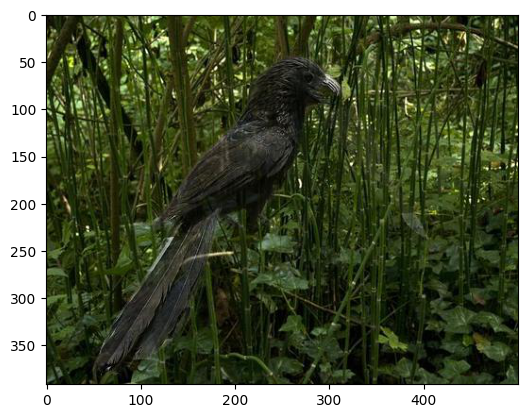

In [265]:
for idx in range(len(split_data)): 
    item = split_data[idx]
    print(item)
    plt.imshow(item[0])
    plt.show()
    break

# Load as torchvision dataset

In [6]:
metadata = pd.read_csv(dataset_path + "/metadata.csv", index_col=0)

In [7]:
metadata

,img_filename,y,split,place,place_filename
img_id,,,,,
1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,2,1,/o/ocean/00002178.jpg
2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/l/lake/natural/00000065.jpg
3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,2,0,/b/bamboo_forest/00000131.jpg
4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/o/ocean/00001268.jpg
5,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/o/ocean/00003147.jpg
...,...,...,...,...,...
11784,200.Common_Yellowthroat/Common_Yellowthroat_00...,0,0,0,/f/forest/broadleaf/00001288.jpg
11785,200.Common_Yellowthroat/Common_Yellowthroat_00...,0,2,0,/f/forest/broadleaf/00004142.jpg
11786,200.Common_Yellowthroat/Common_Yellowthroat_00...,0,2,0,/f/forest/broadleaf/00003041.jpg


In [102]:
water_place_keywords = metadata[metadata['place'] == 1]['place_filename'].apply(lambda x: x.split("/")[2]).drop_duplicates().values
land_place_keywords = metadata[metadata['place'] == 0]['place_filename'].apply(lambda x: x.split("/")[2]).drop_duplicates().values

In [103]:
water_place_keywords

array(['ocean', 'lake'], dtype=object)

In [104]:
land_place_keywords

array(['bamboo_forest', 'forest'], dtype=object)

In [177]:
class WaterBirds(Dataset): 
    # Assume metadata has been split already 
    def __init__(self, img_dir, metadata, transform=None): 
        self.transform = transform
        self.img_dir = img_dir
        self.metadata = metadata.reset_index()
        
    def __len__(self): 
        return len(self.metadata) 
        
    def __getitem__(self, idx): 
        img = cv2.imread(self.img_dir + "/" + self.metadata.loc[idx, 'img_filename'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if self.transform:
            img = self.transform(img)
        waterbird_label = self.metadata.loc[idx, 'y']
        place_label = self.metadata.loc[idx, 'place']
        waterbird_species = self.metadata.loc[idx, 'img_filename'].split(".")[1].split("/")[0]
        
        return {'img': img, 
                'bird_label': waterbird_label, 
                'place_label': place_label, 
                'species': waterbird_species} 

In [ ]:
# 0 is train
# 1 is val, equal location 
# 2 is test, equal location 
# place = 0 (land), place = 1 (ocean)
# y = 0 (landbird), y = 1 (waterbird), 

In [74]:
place_map = {
    0: 'land', 
    1: 'water',}
y_map = {
    0: 'landbird', 
    1: 'waterbird'}

In [178]:
train_ds = WaterBirds(dataset_path, metadata[metadata['split'] == 0])
val_ds = WaterBirds(dataset_path, metadata[metadata['split'] == 1])
test_ds = WaterBirds(dataset_path, metadata[metadata['split'] == 2])

In [ ]:
metadata[metadata['split'] == 2]

water
waterbird


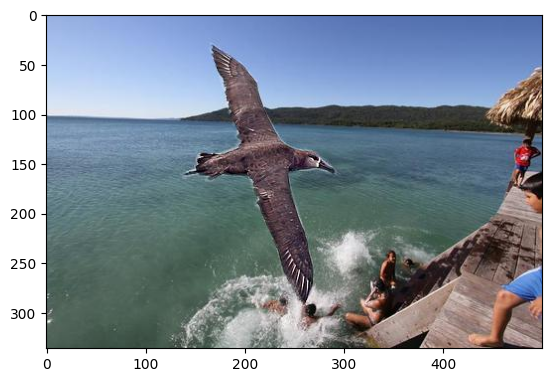

water
waterbird


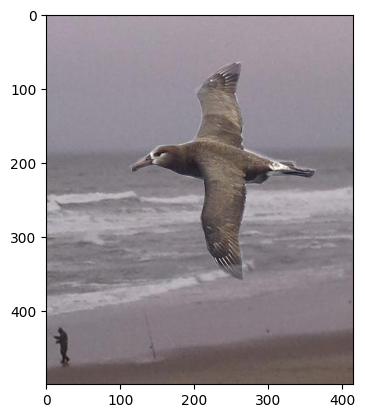

water
waterbird


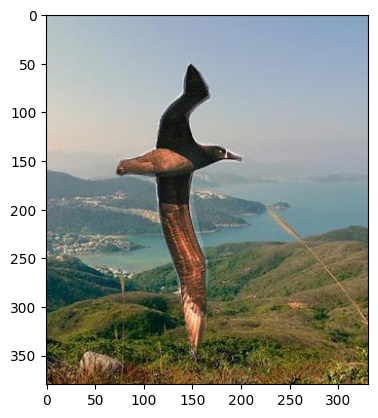

water
waterbird


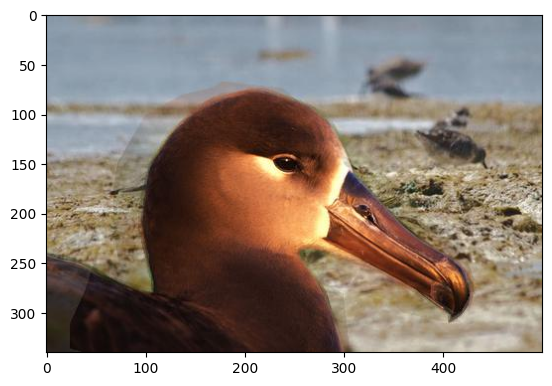

water
waterbird


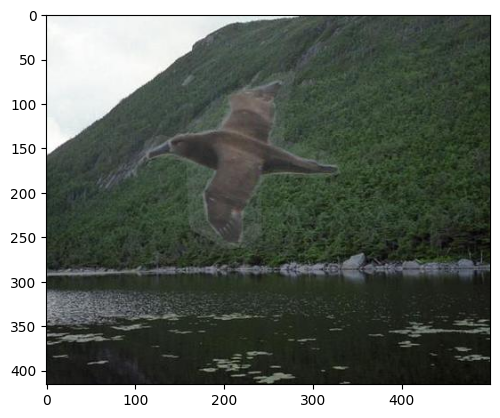

water
waterbird


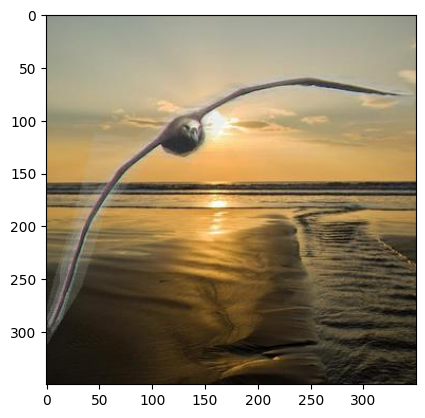

water
waterbird


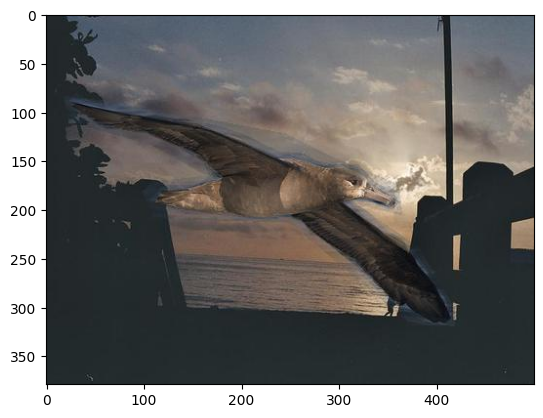

water
waterbird


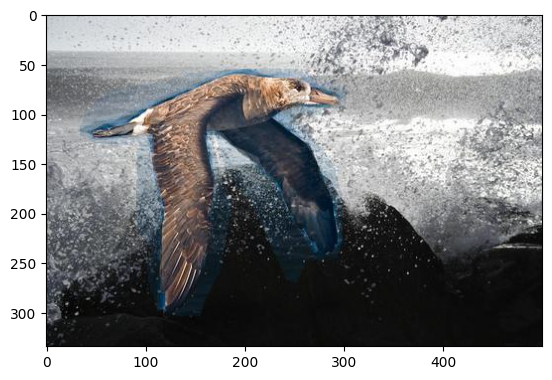

water
waterbird


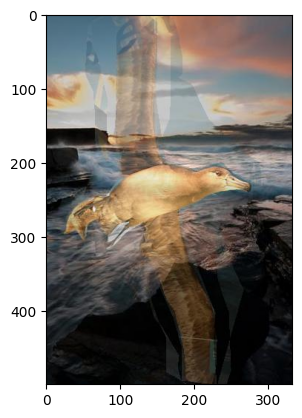

water
waterbird


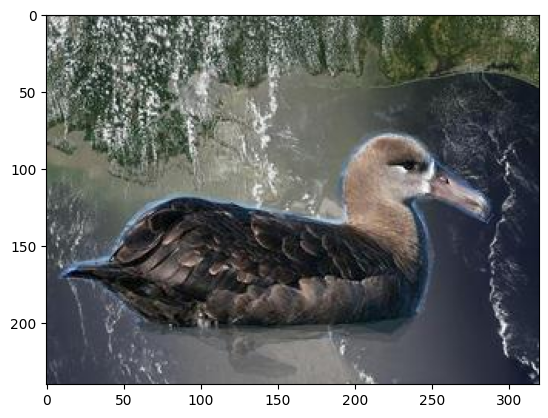

In [179]:
for i in range(10): 
    print(place_map[train_ds[i]['place_label']]) 
    print(y_map[train_ds[i]['bird_label']])
    plt.imshow(Image.fromarray(train_ds[i]['img']).convert("RGB"))
    plt.show()

land
landbird


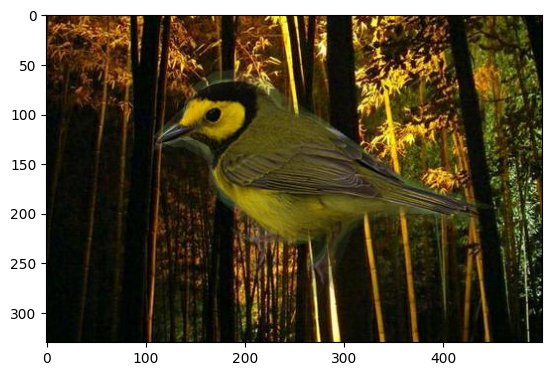

land
landbird


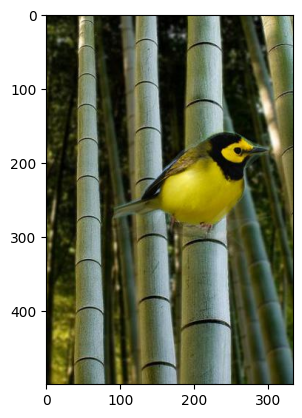

land
landbird


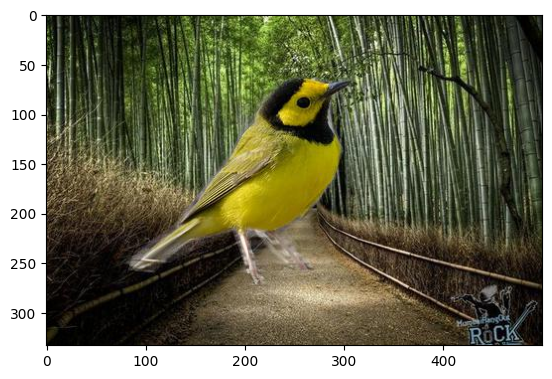

land
landbird


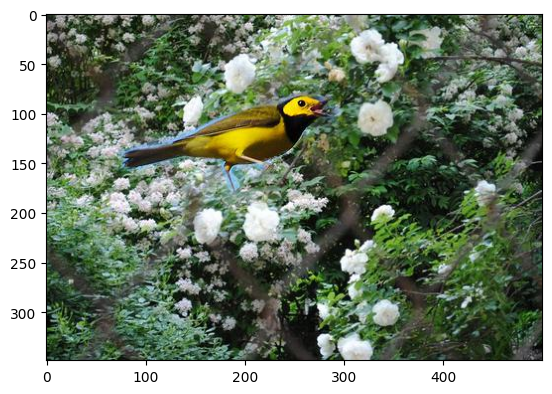

land
landbird


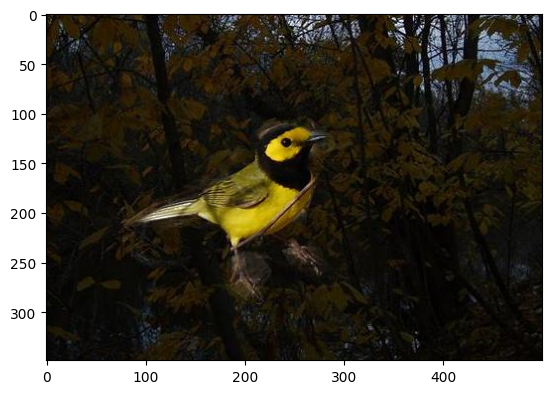

land
landbird


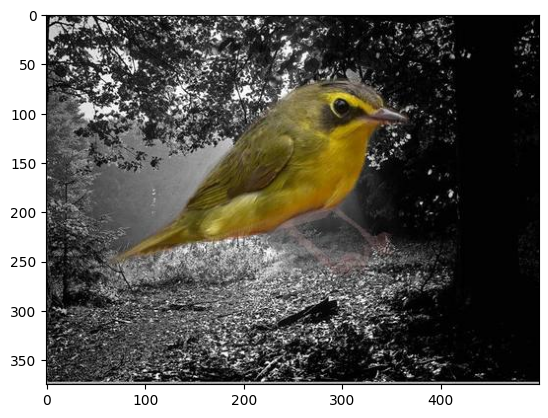

land
landbird


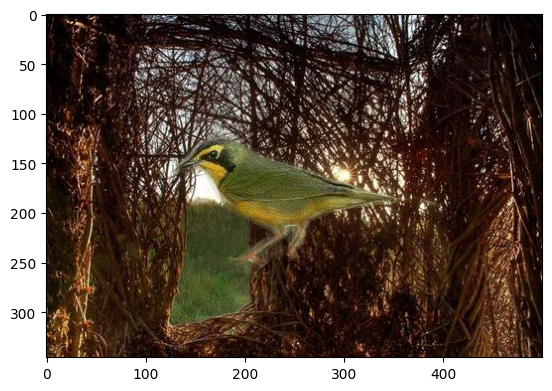

land
landbird


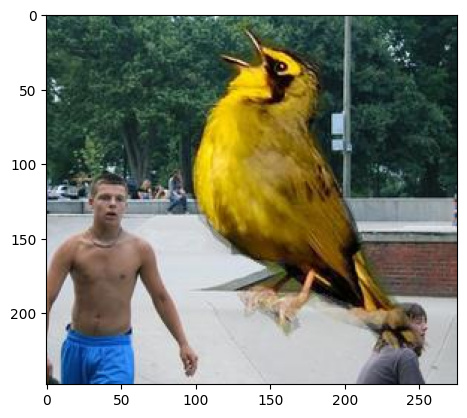

land
landbird


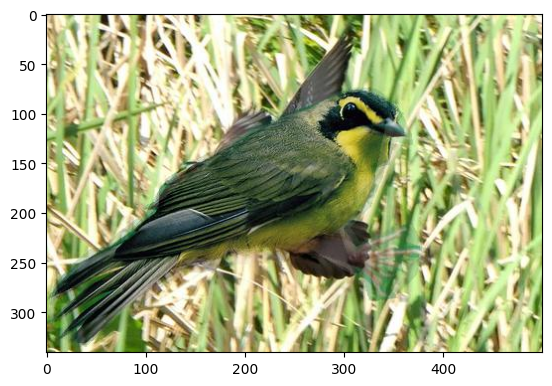

land
landbird


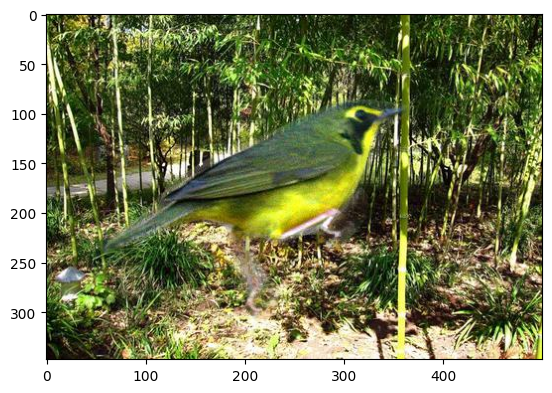

In [180]:
for i in range(4000, 4010): 
    print(place_map[train_ds[i]['place_label']]) 
    print(y_map[train_ds[i]['bird_label']])
    plt.imshow(Image.fromarray(train_ds[i]['img']).convert("RGB"))
    plt.show()

land
landbird


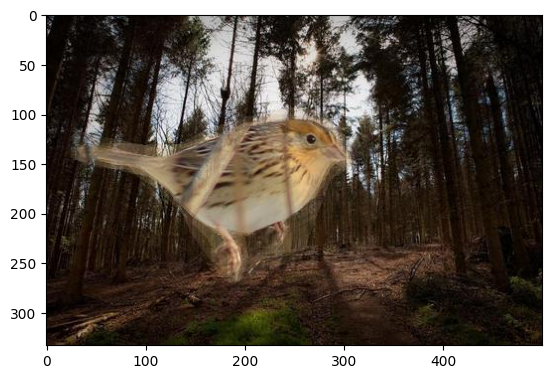

land
landbird


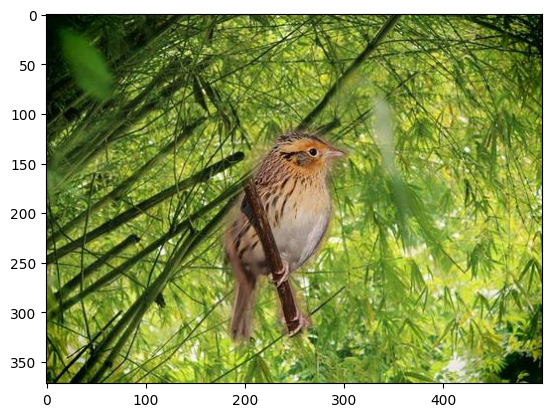

land
landbird


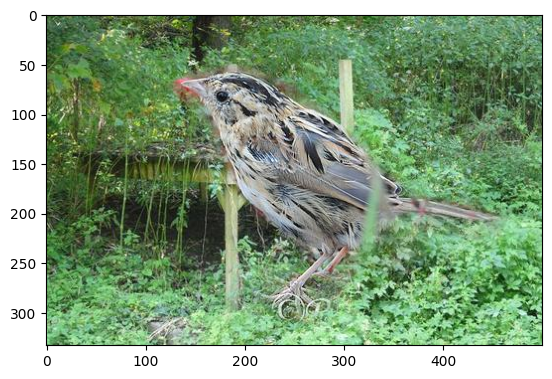

water
landbird


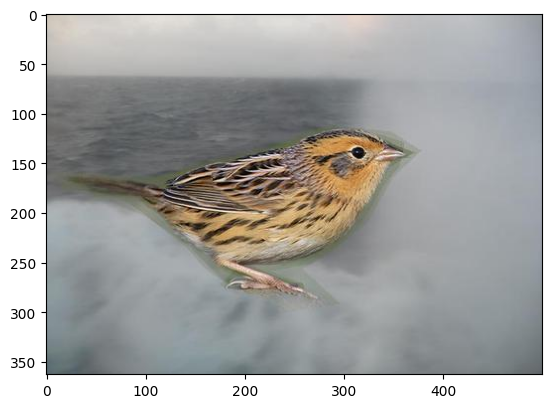

land
landbird


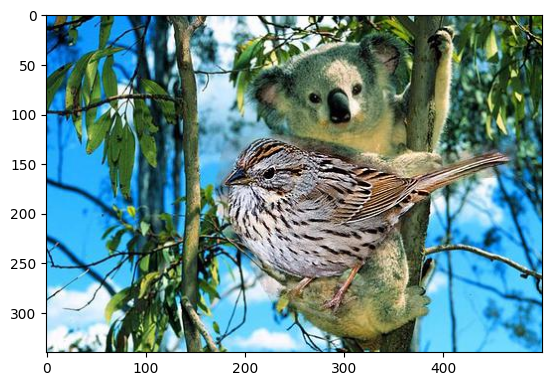

water
landbird


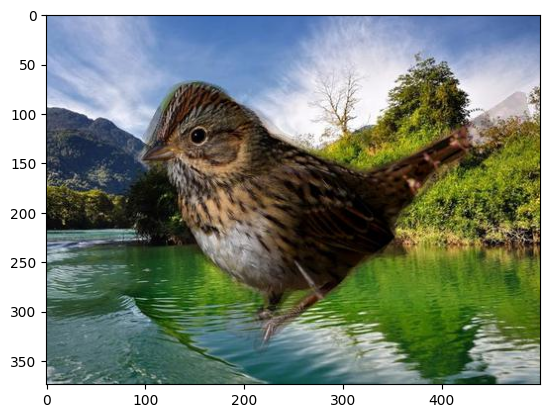

land
landbird


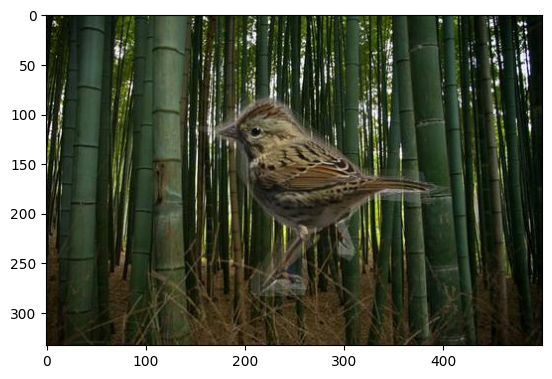

land
landbird


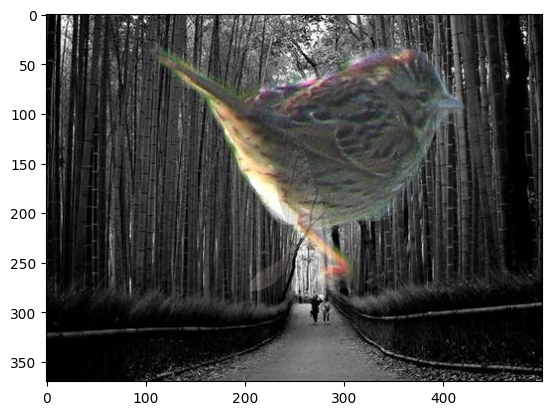

land
landbird


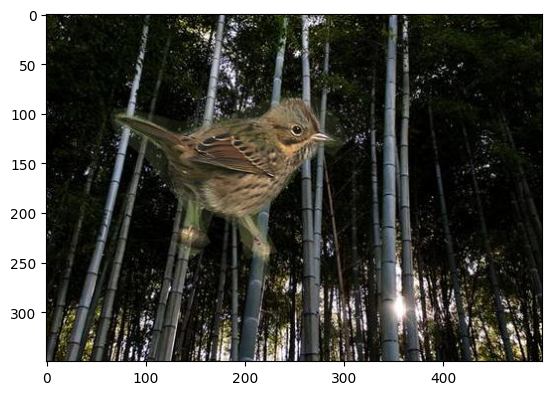

land
landbird


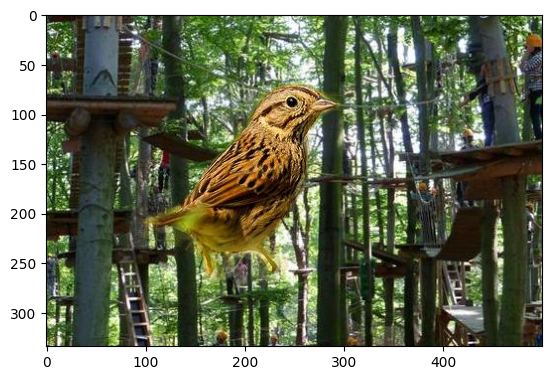

In [181]:
for i in range(3000, 3010): 
    print(place_map[train_ds[i]['place_label']]) 
    print(y_map[train_ds[i]['bird_label']])
    plt.imshow(Image.fromarray(train_ds[i]['img']).convert("RGB"))
    plt.show()

# Masked Inpainting

In [6]:
import torchvision.datasets as dsets
from collections import Counter

In [3]:
def get_counts(labels):
    values, counts = np.unique(labels, return_counts=True)
    sorted_tuples = zip(*sorted(zip(values, counts))) # this just ensures we are getting the counts in the sorted order of the keys
    values, counts = [ list(tuple) for tuple in  sorted_tuples]
    fracs   = 1 / torch.Tensor(counts)
    return fracs / torch.max(fracs)

class Waterbirds:
    def __init__(self, root, split, transform=None):
        self.root = root
        self.df = pd.read_csv(os.path.join(root, 'metadata.csv'))
        if split == 'train':
            self.df = self.df[self.df.split == 0]
        elif split == 'val':
            self.df = self.df[self.df.split == 1]
        elif split == 'test':
            self.df = self.df[self.df.split == 2]
        # self.class_names = [f.split('/')[0] for f in self.df['img_filename'].unique()]
        self.class_names = ['Landbird', 'Waterbird']
        self.group_names = ['land_landbird', 'land_waterbird', 'water_landbird', 'water_waterbird']
        self.samples =[(f,y) for f,y in zip(self.df['img_filename'], self.df['y'])]
        self.targets = [s[1] for s in self.samples]
        self.classes = ['land', 'water']
        self.transform = transform
        self.class_weights = get_counts(self.df['y']) # returns class weight for XE
        self.groups = [] # create group labels
        for (label, place) in zip(self.df['y'], self.df['place']):
            if place == 0:
                group = 0 if label == 0 else 1
            else:
                group = 2 if label == 0 else 3
            self.groups.append(group)
        print(f"{split} \t group counts: {Counter(self.groups)}")
        self.group_weights = get_counts(self.groups) # returns group weight for XE
        

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        sample = self.df.iloc[idx]
        img = Image.open(os.path.join(self.root, sample['img_filename'])).convert('RGB')
        label = int(sample['y'])
        place = int(sample['place'])
        group = self.groups[idx]
        species = sample['img_filename'].split('/')[0]
        if self.transform:
            img = self.transform(img)
        return img, label, group

    def get_subset(self, groups=[0,1,2,3], num_per_class=5):
        self.df['group'] = self.groups
        df = self.df.reset_index(drop=True)
        df['orig_idx'] = df.index
        df['class'] = [f.split('/')[0] for f in df.img_filename]
        df = df[df.group.isin(groups)]
        return df.groupby('class').apply(lambda x: x.sample(n=num_per_class) if len(x) > num_per_class else x.sample(n=len(x))).reset_index(drop=True)['orig_idx'].values

In [7]:
# Generate target domain images for all birds in train dataset 
root = "/mnt/scratch-lids/scratch/qixuanj/waterbird_complete95_forest2water2"
train_ds = Waterbirds(root, "train")
train_ids = list(Waterbirds.get_subset(train_ds, groups=[0])) + list(Waterbirds.get_subset(train_ds, groups=[3]))
train_ds = torch.utils.data.Subset(train_ds, train_ids)

train 	 group counts: Counter({0: 3498, 3: 1057, 2: 184, 1: 56})


In [56]:
output_dir = "/mnt/scratch-lids/scratch/qixuanj/waterbird_generated_images/816"
if not os.path.exists(output_dir): 
    os.makedirs(output_dir)

In [58]:
from transformers import pipeline
seg_pipe = pipeline("image-segmentation", model="briaai/RMBG-1.4", trust_remote_code=True)

In [61]:
from diffusers import StableDiffusionInpaintPipeline
from diffusers import UNet2DConditionModel

checkpoint = 800
model_id = "runwayml/stable-diffusion-v1-5"
file_prefix = f"/mnt/scratch-lids/scratch/qixuanj/waterbirds_finetune_sd_base/checkpoint-{checkpoint}"
unet = UNet2DConditionModel.from_pretrained(f"{file_prefix}/unet")
pipe = StableDiffusionInpaintPipeline.from_pretrained(model_id, unet=unet, dtype=torch.bfloat16, safety_checker=None,)
pipe.to("cuda")

generator = torch.Generator("cuda").manual_seed(0)

Keyword arguments {'dtype': torch.bfloat16} are not expected by StableDiffusionInpaintPipeline and will be ignored.
Loading pipeline components...: 100%|███████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 12.83it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [59]:
for i in tqdm(range(len(train_ds))): 
    img, class_label, group_label = train_ds[i]
    img = img.convert("RGB")
    pillow_mask = seg_pipe(img, return_mask = True)
    mask = np.array(pillow_mask)
    inv_mask = np.invert(mask)
    # Get mask of background and convert to PIL 
    mask_mod = Image.fromarray(np.uint8(inv_mask)).convert("L")

    if class_label == 0: 
        bird = "landbird"
    else: 
        bird = "waterbird"

    prompt = f"a photo of {bird} with background of <wb-source-domain>"
    image1 = pipe(prompt=prompt, 
                 negative_prompt=''' pixelated, blurry, jpeg artifacts, low quality, 
                                     cartoon, artwork, cgi, illustration, painting, overexposed, 
                                     grayscale, grainy, white spots, multiple angles, ''',
                 image=img, 
                 mask_image=mask_mod, 
                 strength=0.5,
                 guidance_scale=7.5,
                 num_inference_steps=50, 
                 generator=generator,).images[0]
    
    image2 = pipe(prompt=prompt, 
                 negative_prompt=''' pixelated, blurry, jpeg artifacts, low quality, 
                                     cartoon, artwork, cgi, illustration, painting, overexposed, 
                                     grayscale, grainy, white spots, multiple angles, ''',
                 image=img, 
                 mask_image=mask_mod, 
                 strength=0.7,
                 guidance_scale=7.5,
                 num_inference_steps=50, 
                 generator=generator,).images[0]
    image1.save(output_dir + f"/image{i}_1.png")
    image2.save(output_dir + f"/image{i}_2.png")
    break

  0%|                                                                                                                | 0/1000 [00:46<?, ?it/s]


KeyboardInterrupt: 

## Debug

In [ ]:
img, class_label, group_label = train_ds[0]

In [12]:
from transformers import pipeline
# 'animal' -> okay, not great 
# segmenter = pipeline("image-segmentation", model="nvidia/segformer-b3-finetuned-ade-512-512")
pipe = pipeline("image-segmentation", model="briaai/RMBG-1.4", trust_remote_code=True)

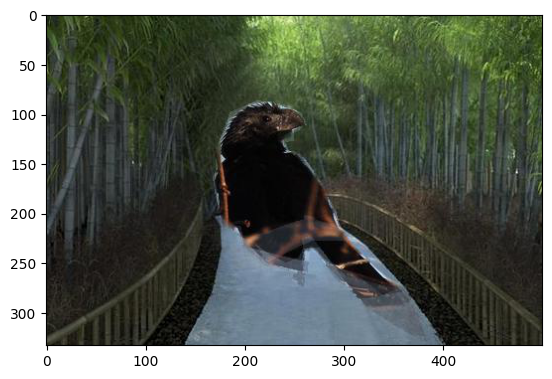

In [14]:
img = img.convert("RGB")
plt.imshow(img)

In [15]:
pillow_mask = pipe(img, return_mask = True) # outputs a pillow mask

In [16]:
pillow_image = pipe(img)

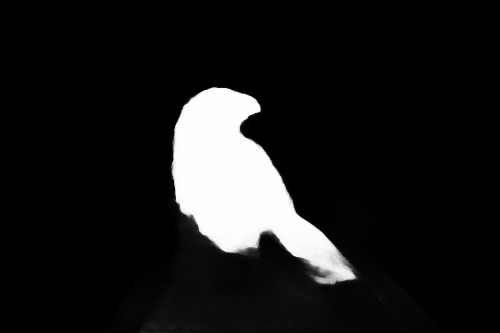

In [17]:
pillow_mask

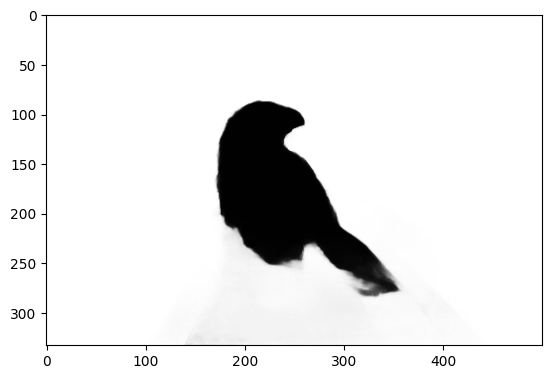

In [18]:
mask = np.array(pillow_mask)
inv_mask = np.invert(mask)
mask_mod = Image.fromarray(np.uint8(inv_mask)).convert("L")
plt.imshow(mask_mod, cmap='gray')

In [22]:
from diffusers import StableDiffusionInpaintPipeline
from diffusers import UNet2DConditionModel

In [49]:
# TODO replace this with the best transfer checkpoint
checkpoint = 800
model_id = "runwayml/stable-diffusion-v1-5"
file_prefix = f"/mnt/scratch-lids/scratch/qixuanj/waterbirds_finetune_sd_base/checkpoint-{checkpoint}"
unet = UNet2DConditionModel.from_pretrained(f"{file_prefix}/unet")
pipe = StableDiffusionInpaintPipeline.from_pretrained(model_id, unet=unet, dtype=torch.bfloat16, safety_checker=None,)
# Use CPU alternative
# pipe.to("cuda")
pipe.to("cpu")

Keyword arguments {'dtype': torch.bfloat16} are not expected by StableDiffusionInpaintPipeline and will be ignored.
Loading pipeline components...: 100%|███████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 13.05it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


StableDiffusionInpaintPipeline {
  "_class_name": "StableDiffusionInpaintPipeline",
  "_diffusers_version": "0.28.0.dev0",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [50]:
# generator = torch.Generator("cuda").manual_seed(0)
generator = torch.Generator("cpu").manual_seed(0)

In [51]:
class_label

0

In [52]:
if class_label == 0: 
    bird = "landbird"
else: 
    bird = "waterbird"

In [53]:
torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [01:31<00:00,  2.61s/it]


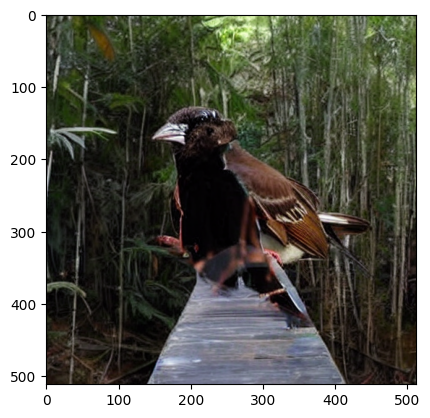

In [54]:
prompt = f"a photo of {bird} with background of <wb-source-domain>"

image = pipe(prompt=prompt, 
             negative_prompt=''' pixelated, blurry, jpeg artifacts, low quality, 
                                 cartoon, artwork, cgi, illustration, painting, overexposed, 
                                 grayscale, grainy, white spots, multiple angles, ''',
             image=img, 
             mask_image=mask_mod, 
             strength=0.7,
             guidance_scale=7.5,
             num_inference_steps=50, 
             generator=generator).images[0]

plt.figure()
plt.imshow(image)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:02<00:00, 11.86it/s]


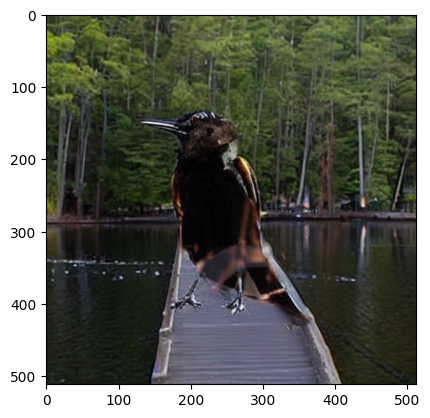

In [33]:
prompt = f"a photo of landbird with background of blue ocean or lake or water"

image = pipe(prompt=prompt, 
             negative_prompt=''' forest, trees, green, plants,
                                 pixelated, blurry, jpeg artifacts, low quality, 
                                 cartoon, artwork, cgi, illustration, painting, overexposed, 
                                 grayscale, grainy, white spots, multiple angles, ''',
             image=img, 
             mask_image=mask_mod, 
             strength=0.7,
             guidance_scale=7.5,
             num_inference_steps=50, 
             generator=generator).images[0]

plt.figure()
plt.imshow(image)

# Img2Img Pipeline

In [33]:
from diffusers import StableDiffusionImg2ImgPipeline

In [185]:
# use cpu to avoid clashing
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.bfloat16,
)
pipe.to("cuda")

Loading pipeline components...: 100%|█████████████████████████████████████████████████████████████████████████████| 7/7 [00:02<00:00,  3.36it/s]


StableDiffusionImg2ImgPipeline {
  "_class_name": "StableDiffusionImg2ImgPipeline",
  "_diffusers_version": "0.28.0.dev0",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [186]:
idx = 0

In [187]:
place_map[train_ds[idx]['place_label']]

'water'

In [188]:
y_map[train_ds[idx]['bird_label']]

'waterbird'

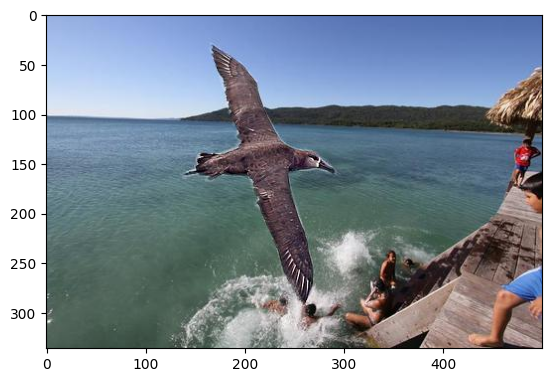

In [189]:
plt.imshow(Image.fromarray(train_ds[idx]['img']))
plt.show()

In [45]:
generator = torch.Generator(0)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 28.57it/s]


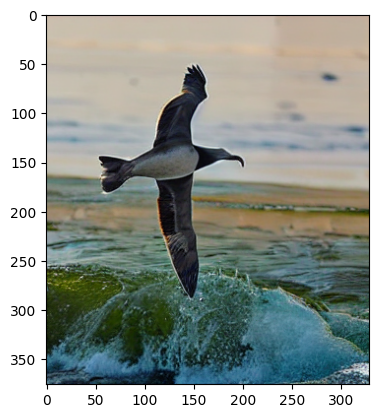

In [60]:
# better with class label 
prompt = f"a photo of {train_ds[idx]['species']} on background of ocean"

image = pipe(prompt=prompt, 
             image=Image.fromarray(train_ds[idx]['img']),
             negative_prompt='''pixelated, blurry, jpeg artifacts, low quality, 
                                 cartoon, artwork, cgi, illustration, painting, overexposed, 
                                 grayscale, grainy, white spots, multiple angles, ''',
             strength=0.5,
             guidance_scale=7.5,
             num_inference_steps=50, 
             generator=generator).images[0]
plt.figure()
plt.imshow(image)

In [ ]:
# have more difficulty generating forest

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 29.12it/s]


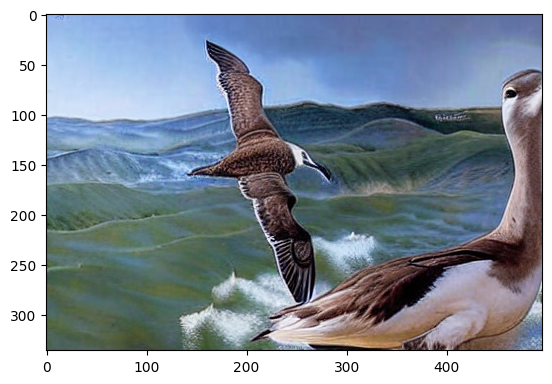

In [194]:
prompt = f"a photo of {train_ds[idx]['species']} in green forest"

image = pipe(prompt=prompt, 
             image=Image.fromarray(train_ds[idx]['img']),
             negative_prompt='''water, lake, ocean, pixelated, blurry, jpeg artifacts, low quality, 
                                 cartoon, artwork, cgi, illustration, painting, overexposed, 
                                 grayscale, grainy, white spots, multiple angles,''',
             
             strength=0.5,
             guidance_scale=10,
             num_inference_steps=50, 
             generator=generator).images[0]
plt.figure()
plt.imshow(image)